# Exploratory data analyses & statistical validation in preparation for DGE analysis

## **Content**
### 1. Exploratory PCAs on TPM counts: 4 combinations
### 2. UMAP
### 3. PCA on ELC on filtered TPM
### 4. Library size & log10 counts boxplot
### 5. Normalization with DeSeq2 / r-sleuth package
### 6. Confirming normalization efficiency with PCAs on TPM counts
### 7. Pearson's correlation matrix
### 8. Build comparism figures

In [189]:
library(DESeq2, warn.conflicts = FALSE)
library(sleuth, warn.conflicts = FALSE)
library(plyr, warn.conflicts = FALSE)
library(tidyverse, warn.conflicts = FALSE)
library(cowplot, warn.conflicts = FALSE)
library(vsn, warn.conflicts = FALSE)
library(hexbin, warn.conflicts = FALSE)
library(FactoMineR, warn.conflicts = FALSE)
library(factoextra, warn.conflicts = FALSE)
library(edgeR, warn.conflicts = FALSE)
library(RColorBrewer, warn.conflicts = FALSE)
library(umap, warn.conflicts = FALSE)
library(ggsci, warn.conflicts = FALSE)
library(svglite, warn.conflicts = FALSE)
library(corrplot, warn.conflicts = FALSE)
library(patchwork, warn.conflicts = FALSE)
theme_set(theme_bw())

In [2]:
set.seed(42) # For reproducibility of results

In [3]:
# import count table
setwd("/nfs/pgsb/projects/comparative_triticeae/phenotype/flower_development/refsets/hordeum/")
hord <- readRDS("barley_count_table_merged.rds")
h <- hord$counts
dim(h)
head(h)
# dimensions shows that a total of 193 samples were mapped to 49 281 genes of H.vulgare

[1] 49281   240

,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,ERR781048,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
Horvu_MOREX_1H01G000100,336.0000,122.0000,66.0000,208.0000,354.000,452.0000,388.0000,405.0000,359.0000,657.000,⋯,1232.000,2237.000,1503.000,1833.000,1695.000,2477.000,2265.000,2578.000,2468.000,2317.000
Horvu_MOREX_1H01G000200,1.0000,0.0000,0.0000,1.0000,1.000,1.0000,1.0000,0.0000,0.0000,1.000,⋯,1.000,3.000,10.000,1.000,2.000,8.000,6.000,0.000,2.000,2.000
Horvu_MOREX_1H01G000300,116.0000,56.0000,45.0000,98.0000,108.000,163.0000,160.0000,133.0000,117.0000,284.000,⋯,428.000,610.000,519.000,466.000,492.000,652.000,569.000,677.000,710.000,584.000
Horvu_MOREX_1H01G000400,550.0000,184.0000,133.0000,351.0000,549.000,657.0000,577.0000,605.0000,540.0000,1183.000,⋯,971.000,1640.000,1312.000,1160.000,2093.000,2738.000,2795.000,3687.000,3044.000,3045.000
Horvu_MOREX_1H01G000500,556.0000,167.0000,116.0000,382.0000,511.000,635.0000,772.0000,607.0000,630.0000,1166.000,⋯,3656.000,4336.000,4734.000,4469.000,2296.000,2418.000,2349.000,3908.000,3340.000,3221.000
Horvu_MOREX_1H01G000600,707.3084,260.5543,146.4439,381.1077,572.695,776.8168,827.0809,874.5452,566.1862,1397.799,⋯,2808.661,3316.393,2766.549,2833.275,2984.255,4250.868,3915.629,4172.974,4106.843,4045.146


In [4]:
# import metadata
setwd("/home/vanda.marosi/floral_development_thesis_vm/datatables/")
# stringsAsfactors has to be truse for deseq2 design
barley_metadata <- read.table("barley_final.csv", header = TRUE, sep = ",", stringsAsFactors = TRUE)
barley_meta <- select(barley_metadata, Run.ID, Dataset, Batch, Cultivar, GM, Zadok_scale, Intermediate_age, High_level_age, Intermediate_tissue, High_level_tissue, Treatment, RNA_extraction, RNA_enrichment, RNA_input..microg., PCR_purification, Growth_condition, Day_night_condition, Temperature_day_night_c, Growth_location, Seq_location, Instrument, Library.layout)
colnames(barley_meta) <- c("ID", "dataset", "batch", "cultivar", "gm", "zadoc_scale", "intermediate_age", "high_level_age", "intermediate_tissue", "high_level_tissue", "treatment", "rna_extraction", "rna_enrichment", "rna_input", "pcr_purification", "growth_condition", "day_night", "temp", "growth_location", "seq_location", "instrument", "library")
# add rownames for deseq2 to identify rows with count-columns
rownames(barley_meta) <- barley_meta$ID
glimpse(barley_meta)
tail(barley_meta)

Rows: 240
Columns: 22
$ ID                  <fct> ERR781039, ERR781040, ERR781041, ERR781042, ERR78…
$ dataset             <fct> photoperiod_mutant_preanthesis, photoperiod_mutan…
$ batch               <int> 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 5, 5, 5, 6, 6, 6…
$ cultivar            <fct> S42-IL107, S42-IL107, S42-IL107, Scarlett, Scarle…
$ gm                  <fct> wt, wt, wt, mut, mut, mut, wt, wt, wt, wt, wt, wt…
$ zadoc_scale         <int> 9, 9, 9, 11, 11, 11, 11, 11, 11, 14, 14, 14, 14, …
$ intermediate_age    <fct> Germination, Germination, Germination, Leaf_devel…
$ high_level_age      <fct> Seedling, Seedling, Seedling, Vegetative, Vegetat…
$ intermediate_tissue <fct> apex, apex, apex, apex, apex, apex, apex, apex, a…
$ high_level_tissue   <fct> meristem, meristem, meristem, meristem, meristem,…
$ treatment           <fct> control, control, control, mutant, mutant, mutant…
$ rna_extraction      <fct> trizol, trizol, trizol, trizol, trizol, trizol, t…
$ rna_enrichment      <fct> Rn

,ID,dataset,batch,cultivar,gm,zadoc_scale,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,⋯,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,growth_location,seq_location,instrument,library
,<fct>,<fct>,<int>,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
ERR515192,ERR515192,laxatum_mutant,75,Bowman,wt,31,Stem_elongation,Reproductive,spike,inflorescence,⋯,unknown,unknown,unknown,unknown,unknown,unknown,Germany_Gatersleben,Germany_Gatersleben,Illumina HiSeq 2000,paired
ERR515193,ERR515193,laxatum_mutant,75,Bowman,wt,31,Stem_elongation,Reproductive,spike,inflorescence,⋯,unknown,unknown,unknown,unknown,unknown,unknown,Germany_Gatersleben,Germany_Gatersleben,Illumina HiSeq 2000,paired
ERR515194,ERR515194,laxatum_mutant,75,Bowman,wt,31,Stem_elongation,Reproductive,spike,inflorescence,⋯,unknown,unknown,unknown,unknown,unknown,unknown,Germany_Gatersleben,Germany_Gatersleben,Illumina HiSeq 2000,paired
ERR515195,ERR515195,laxatum_mutant,76,Bowman,mut,31,Stem_elongation,Reproductive,spike,inflorescence,⋯,unknown,unknown,unknown,unknown,unknown,unknown,Germany_Gatersleben,Germany_Gatersleben,Illumina HiSeq 2000,paired
ERR515196,ERR515196,laxatum_mutant,76,Bowman,mut,31,Stem_elongation,Reproductive,spike,inflorescence,⋯,unknown,unknown,unknown,unknown,unknown,unknown,Germany_Gatersleben,Germany_Gatersleben,Illumina HiSeq 2000,paired
ERR515197,ERR515197,laxatum_mutant,76,Bowman,mut,31,Stem_elongation,Reproductive,spike,inflorescence,⋯,unknown,unknown,unknown,unknown,unknown,unknown,Germany_Gatersleben,Germany_Gatersleben,Illumina HiSeq 2000,paired


### Subsetting categorical variables: 
* **technical variables:** "ID", "dataset", "batch", "rna_extraction", "rna_enrichment", "rna_input", "pcr_purification", "growth_condition", "day_night", "temp", "growth_location", "seq_location", "instrument", "library"
* **biological variables:** "cultivar", "gm", "treatment", "zadoc_scale", "intermediate_age", "high_level_age", "intermediate_tissue", "high_level_tissue",

In [5]:
# separate technical variables from metadata
barley_tech_meta <- select(barley_meta, ID, dataset, batch, rna_extraction, rna_enrichment, rna_input, pcr_purification, growth_condition, day_night, temp, growth_location, seq_location, instrument, library)

In [6]:
# separate biological variables from metadata
barley_bio_meta <- select(barley_meta, ID, dataset, cultivar, gm, treatment, zadoc_scale, intermediate_age, high_level_age, intermediate_tissue, high_level_tissue)

In [145]:
# mixed most important variables from metadata
barley_mix_meta <- select(barley_meta, ID, dataset, cultivar, instrument, library, gm, growth_condition, intermediate_age, high_level_age, intermediate_tissue, high_level_tissue)

# 1. Exploratory analysis with PCAs
* in my exploratory analysis unscaled PCAs are performed using raw and filtered & log10-transformed count tables to see the effect of batches and other different technical variables that can be used for the model of variance stabilization

## 1.1 PCA on raw TPM counts without filtering using `FactoMineR` and `factoextra`

In [8]:
dim(h)
# switching rows to columns
cnt <- t(h)
cnt <- as.data.frame(cnt, stringsAsFactors = TRUE)
# adding rownames=ID as a column
cnt <- cbind(ID = rownames(cnt), cnt)
rownames(cnt) <- cnt$ID
dim(cnt)
head(cnt)

[1] 49281   240

[1]   240 49282

,ID,Horvu_MOREX_1H01G000100,Horvu_MOREX_1H01G000200,Horvu_MOREX_1H01G000300,Horvu_MOREX_1H01G000400,Horvu_MOREX_1H01G000500,Horvu_MOREX_1H01G000600,Horvu_MOREX_1H01G000700,Horvu_MOREX_1H01G000800,Horvu_MOREX_1H01G000900,⋯,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110200,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,336,1,116,550,556,707.3084,351.0000,368,72,⋯,0,2.759218,0.000000,7.619365,2,0,1,0,0.1512110,0.00000000
ERR781040,ERR781040,122,0,56,184,167,260.5543,111.9312,129,20,⋯,0,5.793865,0.000000,0.000000,0,0,0,0,2.5000000,0.03942593
ERR781041,ERR781041,66,0,45,133,116,146.4439,52.0000,60,11,⋯,0,0.000000,0.000000,0.000000,1,0,0,0,0.0000000,0.00000000
ERR781042,ERR781042,208,1,98,351,382,381.1077,189.9432,198,39,⋯,1,0.000000,1.507178,5.928367,0,0,0,0,0.8098828,0.00000000
ERR781043,ERR781043,354,1,108,549,511,572.6950,314.0000,360,48,⋯,0,2.717011,2.544734,4.332308,0,0,0,0,0.6214817,0.00000000
ERR781044,ERR781044,452,1,163,657,635,776.8168,362.7905,399,68,⋯,0,2.957741,0.000000,0.000000,0,0,0,0,1.1231197,0.00000000


In [9]:
# include metadata table
cnt_meta <- inner_join(barley_tech_meta, cnt, by = "ID")
# add rownames again
rownames(cnt_meta) <- cnt_meta$ID
dim(cnt_meta)
head(cnt_meta)

[1]   240 49295

,ID,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,⋯,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110200,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,⋯,0,2.759218,0.000000,7.619365,2,0,1,0,0.1512110,0.00000000
ERR781040,ERR781040,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,⋯,0,5.793865,0.000000,0.000000,0,0,0,0,2.5000000,0.03942593
ERR781041,ERR781041,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,⋯,0,0.000000,0.000000,0.000000,1,0,0,0,0.0000000,0.00000000
ERR781042,ERR781042,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,⋯,1,0.000000,1.507178,5.928367,0,0,0,0,0.8098828,0.00000000
ERR781043,ERR781043,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,⋯,0,2.717011,2.544734,4.332308,0,0,0,0,0.6214817,0.00000000
ERR781044,ERR781044,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,⋯,0,2.957741,0.000000,0.000000,0,0,0,0,1.1231197,0.00000000


#### Prepare dataset for `FactoMineR`
* check on classes
* to deal with missing values:

By default, missing values in FactoMineR are replaced by the mean of each variable which is not a very proper and convenient way to deal with missing values, especially when there are a lot of them in your dataset. We have implemented a package missMDA to deal with missing values in PCA, in CA, in MCA, in FAMD, and in MFA.

In [10]:
# convert variables which are not factor into factor that they could be part of pca
cnt_meta$rna_input<-factor(cnt_meta$rna_input)
cnt_meta$batch<-factor(cnt_meta$batch)
class(cnt_meta$rna_input)
class(cnt_meta$batch)
# change factor levels where extra levels are present from single dataset: inf_dev & tf_q for dataset, 21 for temp
cnt_meta <- droplevels(cnt_meta)
# delete ID column to not have it as extra supplementary variable
cnt_meta <- select(cnt_meta, -ID)
head(cnt_meta)

[1] "factor"

[1] "factor"

,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,growth_location,⋯,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110200,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,Germany,⋯,0,2.759218,0.000000,7.619365,2,0,1,0,0.1512110,0.00000000
ERR781040,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,Germany,⋯,0,5.793865,0.000000,0.000000,0,0,0,0,2.5000000,0.03942593
ERR781041,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,Germany,⋯,0,0.000000,0.000000,0.000000,1,0,0,0,0.0000000,0.00000000
ERR781042,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,Germany,⋯,1,0.000000,1.507178,5.928367,0,0,0,0,0.8098828,0.00000000
ERR781043,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,Germany,⋯,0,2.717011,2.544734,4.332308,0,0,0,0,0.6214817,0.00000000
ERR781044,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,Germany,⋯,0,2.957741,0.000000,0.000000,0,0,0,0,1.1231197,0.00000000


In [11]:
# create classes to check on class types -> pca can handle supplementary variables only as factors!
classes <- sapply(X = cnt_meta, FUN = class)
table(classes)
which(classes == 'factor')
# it is important to define NAs for missing values and check on factor levels! do this once in the analysis
#table(cnt_meta$dataset, useNA = "always") and so on..

classes
 factor numeric 
     13   49281 

dataset            batch   rna_extraction   rna_enrichment 
               1                2                3                4 
       rna_input pcr_purification growth_condition        day_night 
               5                6                7                8 
            temp  growth_location     seq_location       instrument 
               9               10               11               12 
         library 
              13

# 1.1 UNscaled PCA on raw & not-filtered TPM counts

In [12]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 100)
raw_pca <- PCA(X = cnt_meta, scale.unit = FALSE, ncp = 4, quali.sup = c(1:13), graph = F)
#summary(raw_pca)

,eigenvalue,percentage of variance,cumulative percentage of variance
comp 1,105338946913,30.949514,30.94951
comp 2,60581703814,17.799440,48.74895
comp 3,39840159076,11.705391,60.45435
comp 4,29838481248,8.766810,69.22116
comp 5,22804757196,6.700239,75.92139
comp 6,19753476892,5.803746,81.72514


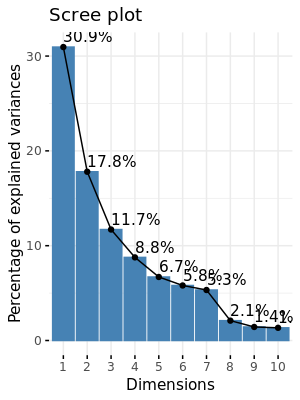

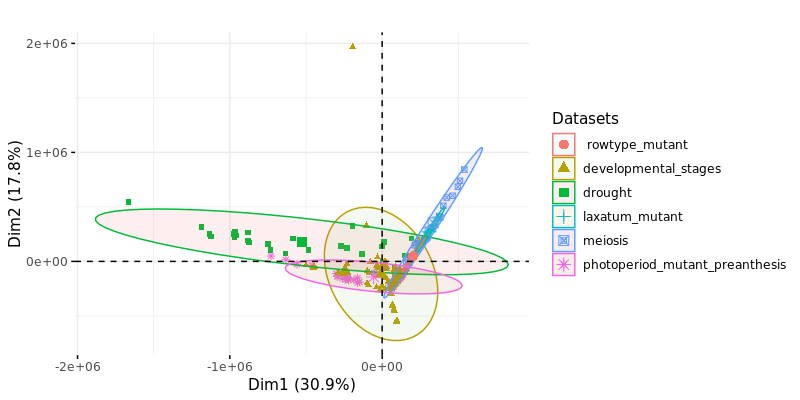

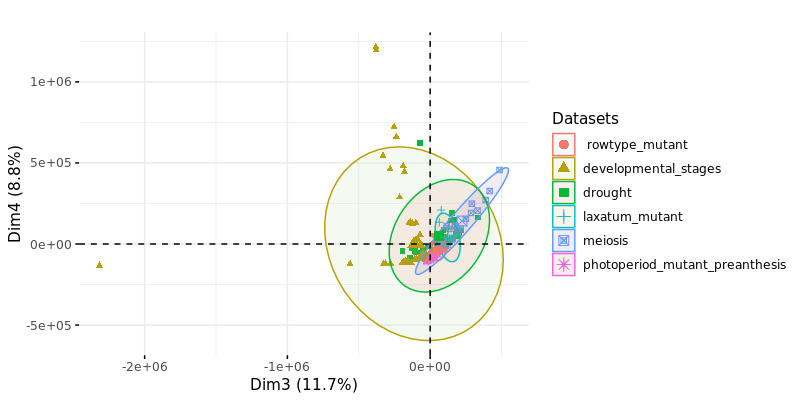

In [13]:
options(repr.plot.width = 3, repr.plot.height = 4, repr.plot.res = 100)
# display eigenvalues
head(raw_pca$eig)
# display scree plot
fviz_eig(raw_pca, addlabels = TRUE)
# display individuals (samples) colored by technical variable
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 100)
colourCount = length(unique(cnt_meta$dataset))
getPalette = colorRampPalette(brewer.pal(12, "Paired"))
fviz_pca_ind(X = raw_pca, label = "none", legend.title = "Datasets", title = "", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))
fviz_pca_ind(X = raw_pca, label = "none", legend.title = "Datasets", title = "", addEllipses = TRUE, axes = c(3, 4), habillage = cnt_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))

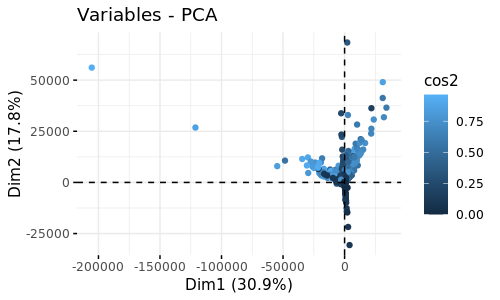

In [14]:
# display variables (genes) colored by quality
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 100)
fviz_pca_var(X = raw_pca, col.var = "cos2", axes = 1:2, label = "none", geom = "point")

# 1.2 **Scaled & centered** PCA on raw & not-filtered TPM counts

In [15]:
# scaling and centering data
dim(h)
cnt <- as.data.frame(h, stringsAsFactors = FALSE)
# filter out zero variance genes that would cause a problem for scaling and centering
filter_cnt <- cnt[(rowSums(cnt)>0), ]
#filter_cnt <- filter_cnt+1
dim(filter_cnt)
# switching columns to rows
switched_cnt_df <- t(filter_cnt)
# scaling and centering
cnt_scaled <- scale(switched_cnt_df, center = TRUE, scale = TRUE)
cnt_scaled <- cnt_scaled+1
# adding rownames=ID as a column
cnt_scaled <- as.data.frame(cnt_scaled, stringsAsFactors = TRUE)
cnt_scaled <- cbind(ID = rownames(cnt_scaled), cnt_scaled)
rownames(cnt_scaled) <- cnt_scaled$ID
dim(cnt_scaled)
head(cnt_scaled)

[1] 49281   240

[1] 46243   240

[1]   240 46244

,ID,Horvu_MOREX_1H01G000100,Horvu_MOREX_1H01G000200,Horvu_MOREX_1H01G000300,Horvu_MOREX_1H01G000400,Horvu_MOREX_1H01G000500,Horvu_MOREX_1H01G000600,Horvu_MOREX_1H01G000700,Horvu_MOREX_1H01G000800,Horvu_MOREX_1H01G000900,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,0.07977662,0.6218743,0.3822245,0.6772662,0.22492253,0.49599998,0.4015209,0.07851779,0.7011648,⋯,0.8540393,0.8013742,0.8206366,0.5904898,0.8581443,0.7193219,0.7813962,0.7877584,0.4229204,0.8308936
ERR781040,ERR781040,-0.12851156,0.6193724,0.2493021,0.2321300,0.01445693,0.07326091,0.1821944,-0.23594720,0.3139294,⋯,0.8540393,0.8013742,0.9634882,0.5904898,0.8005380,0.5454926,0.7576346,0.7877584,1.3982525,0.9779606
ERR781041,ERR781041,-0.18301688,0.6193724,0.2249330,0.1701029,-0.01313625,-0.03471563,0.1272124,-0.32673417,0.2469079,⋯,0.8540393,0.8013742,0.6907505,0.5904898,0.8005380,0.6324073,0.7576346,0.7877584,0.3601303,0.8308936
ERR781042,ERR781042,-0.04480697,0.6218743,0.3423478,0.4352386,0.13078111,0.18733400,0.2537642,-0.14516024,0.4554193,⋯,0.8540393,1.8417645,0.6907505,1.0264710,0.8453595,0.5454926,0.7576346,0.7877584,0.6964332,0.8308936
ERR781043,ERR781043,0.09729619,0.6218743,0.3645015,0.6760500,0.20057561,0.36862265,0.3675764,0.06799177,0.5224408,⋯,0.8540393,0.8013742,0.8186498,1.3266047,0.8332924,0.5454926,0.7576346,0.7877584,0.6181999,0.8308936
ERR781044,ERR781044,0.19268050,0.6218743,0.4863471,0.8074016,0.26766491,0.56177204,0.4123377,0.11930614,0.6713774,⋯,0.8540393,0.8013742,0.8299818,0.5904898,0.8005380,0.5454926,0.7576346,0.7877584,0.8265045,0.8308936


In [16]:
# include metadata table
cnt_meta_scaled <- inner_join(barley_tech_meta, cnt_scaled, by = "ID")
# add rownames again
rownames(cnt_meta_scaled) <- cnt_meta_scaled$ID
dim(cnt_meta_scaled)
head(cnt_meta_scaled)

[1]   240 46257

,ID,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,⋯,0.8540393,0.8013742,0.8206366,0.5904898,0.8581443,0.7193219,0.7813962,0.7877584,0.4229204,0.8308936
ERR781040,ERR781040,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,⋯,0.8540393,0.8013742,0.9634882,0.5904898,0.8005380,0.5454926,0.7576346,0.7877584,1.3982525,0.9779606
ERR781041,ERR781041,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,⋯,0.8540393,0.8013742,0.6907505,0.5904898,0.8005380,0.6324073,0.7576346,0.7877584,0.3601303,0.8308936
ERR781042,ERR781042,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,⋯,0.8540393,1.8417645,0.6907505,1.0264710,0.8453595,0.5454926,0.7576346,0.7877584,0.6964332,0.8308936
ERR781043,ERR781043,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,⋯,0.8540393,0.8013742,0.8186498,1.3266047,0.8332924,0.5454926,0.7576346,0.7877584,0.6181999,0.8308936
ERR781044,ERR781044,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,⋯,0.8540393,0.8013742,0.8299818,0.5904898,0.8005380,0.5454926,0.7576346,0.7877584,0.8265045,0.8308936


In [17]:
# convert variables which are not factor into factor that they could be part of pca
cnt_meta_scaled$rna_input<-factor(cnt_meta_scaled$rna_input)
cnt_meta_scaled$batch<-factor(cnt_meta_scaled$batch)
class(cnt_meta_scaled$rna_input)
class(cnt_meta_scaled$batch)
# change factor levels where extra levels are present from single dataset: inf_dev & tf_q for dataset, 21 for temp
cnt_meta_scaled <- droplevels(cnt_meta_scaled)
# delete ID column to not have it as extra supplementary variable
cnt_meta_scaled <- select(cnt_meta_scaled, -ID)
head(cnt_meta_scaled)

[1] "factor"

[1] "factor"

,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,growth_location,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,Germany,⋯,0.8540393,0.8013742,0.8206366,0.5904898,0.8581443,0.7193219,0.7813962,0.7877584,0.4229204,0.8308936
ERR781040,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,Germany,⋯,0.8540393,0.8013742,0.9634882,0.5904898,0.8005380,0.5454926,0.7576346,0.7877584,1.3982525,0.9779606
ERR781041,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,Germany,⋯,0.8540393,0.8013742,0.6907505,0.5904898,0.8005380,0.6324073,0.7576346,0.7877584,0.3601303,0.8308936
ERR781042,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,Germany,⋯,0.8540393,1.8417645,0.6907505,1.0264710,0.8453595,0.5454926,0.7576346,0.7877584,0.6964332,0.8308936
ERR781043,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,Germany,⋯,0.8540393,0.8013742,0.8186498,1.3266047,0.8332924,0.5454926,0.7576346,0.7877584,0.6181999,0.8308936
ERR781044,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,Germany,⋯,0.8540393,0.8013742,0.8299818,0.5904898,0.8005380,0.5454926,0.7576346,0.7877584,0.8265045,0.8308936


In [18]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 100)
raw_pca_scaled <- PCA(X = cnt_meta_scaled, scale.unit = FALSE, ncp = 4, quali.sup = c(1:13), graph = F)
#summary(raw_pca_scaled)

,eigenvalue,percentage of variance,cumulative percentage of variance
comp 1,9670.024,20.998821,20.99882
comp 2,4097.392,8.897639,29.89646
comp 3,2914.931,6.329883,36.22634
comp 4,2272.507,4.934834,41.16118
comp 5,1572.643,3.415054,44.57623
comp 6,1379.082,2.994729,47.57096


Warning message in brewer.pal(18, "Paired"):
“n too large, allowed maximum for palette Paired is 12
Returning the palette you asked for with that many colors
”

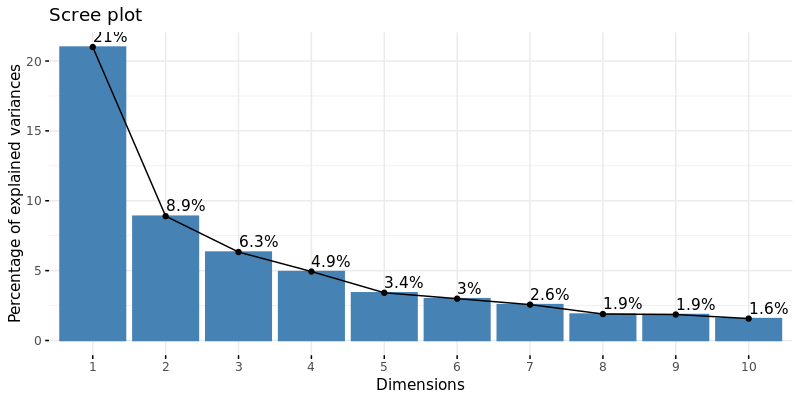

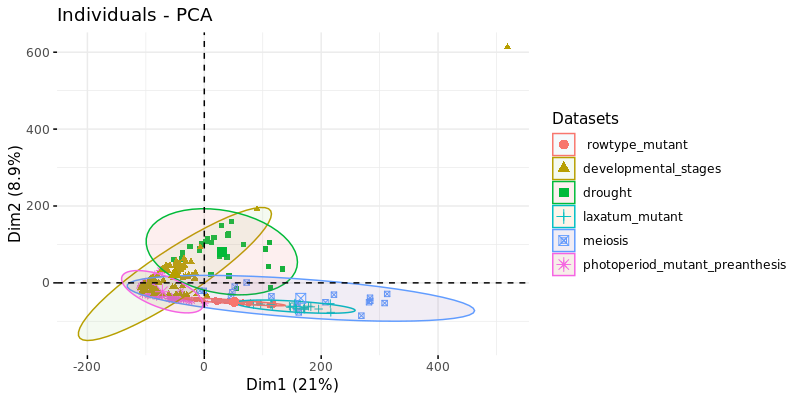

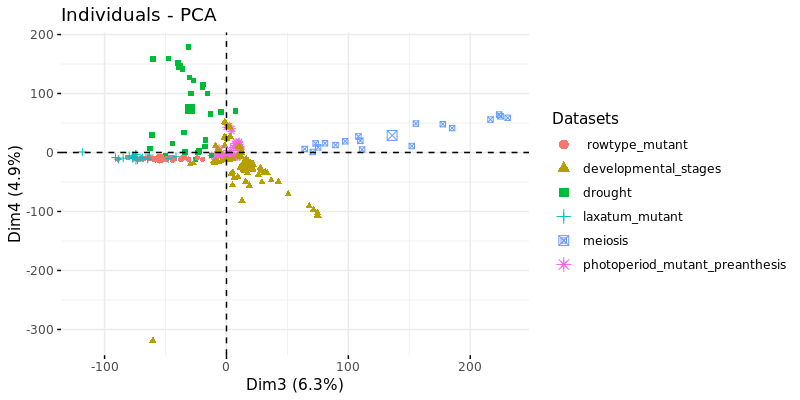

In [19]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 100)
# display eigenvalues
head(raw_pca_scaled$eig)
# display scree plot
fviz_eig(raw_pca_scaled, addlabels = TRUE)
# display individuals (samples) colored by technical variable
colourCount = length(unique(cnt_meta_scaled$dataset))
getPalette = colorRampPalette(brewer.pal(18, "Paired"))
fviz_pca_ind(X = raw_pca_scaled, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_meta_scaled$dataset) +
                scale_fill_manual(values = getPalette(colourCount))
fviz_pca_ind(X = raw_pca_scaled, label = "none", labelsize = 0.4, legend.title = "Datasets", axes = c(3, 4), habillage = cnt_meta_scaled$dataset) +
                scale_fill_manual(values = getPalette(colourCount))

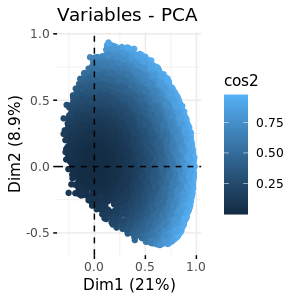

In [20]:
# display variables (genes) colored by quality
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 100)
fviz_pca_var(X = raw_pca_scaled, col.var = "cos2", axes = 1:2, label = "none", geom = "point")

# 1.3. PCA on filtered & log2-transformed TPM counts
### 1.3.1 Filtering out ribosomal-mitochondrial-chloroplast genes to avoid their overrepresentation:
These genes were by default not present in the reference transcriptomes.
Daniel's practice is to filter for: human genome, E.coli, common (wheat) pathogens such as Fusarium, Pseudomonas, Xanthomonas, mitochondrial-ribosomal-chloroplast genes
### 1.3.2 Filter out all genes that have no reads in any of the experiments:

In [21]:
filter_cnt <- h[(rowSums(h)>0), ]
dim(filter_cnt)
# dimensions shows that my 180 samples are successfully mapped with exisiting transcripts to 122 025 genes of T.aestivum

[1] 46243   240

### 1.3.3 Filtering to remove lowly expressed genes
* source: https://combine-australia.github.io/RNAseq-R/06-rnaseq-day1.html

Genes with very low counts across all libraries provide little evidence for differential expression and they interfere with some of the statistical approximations that are used later in the pipeline. They also add to the multiple testing burden when estimating false discovery rates, reducing power to detect differentially expressed genes. These genes should be filtered out prior to further analysis.

When there are biological replicates in each group, in this case we have a minimum sample size of 2 in each group, so we favour filtering on a minimum transcripts per million threshold present in at least 2 samples. We choose to retain genes if they are expressed at a transcripts-per-million (TPM) above 0.5 in at least 2 samples.

* **how to choose ideal cutoff (from above mentioned source):** A TPM of 0.5 is used as it corresponds to a count of 10-15 for the library sizes in this data set. If the count is any smaller, it is considered to be very low, indicating that the associated gene is not expressed in that sample. A requirement for expression in two or more libraries is used as each group contains two replicates. This ensures that a gene will be retained if it is only expressed in one group. Smaller TPM thresholds are usually appropriate for larger libraries. As a general rule, a good threshold can be chosen by identifying the TPM that corresponds to a count of 10, which in this case is about 0.5. You should filter with TPMs rather than filtering on the counts directly, as the latter does not account for differences in library sizes between samples.

In [22]:
# which value in my TPMs are greater than 0.5?
thresh <- filter_cnt >= 0.5
# this gives a logical matrix
head(thresh)

,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,ERR781048,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
Horvu_MOREX_1H01G000100,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,⋯,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE
Horvu_MOREX_1H01G000200,TRUE,FALSE,FALSE,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,TRUE,⋯,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE,TRUE,TRUE
Horvu_MOREX_1H01G000300,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,⋯,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE
Horvu_MOREX_1H01G000400,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,⋯,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE
Horvu_MOREX_1H01G000500,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,⋯,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE
Horvu_MOREX_1H01G000600,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,⋯,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE


In [23]:
# summary of how many TRUEs are in each row
tail(table(rowSums(thresh)))
# there are 12 470 genes that have TRUEs in all 240 samples


  235   236   237   238   239   240 
  257   316   369   455   824 12470 

In [24]:
# we would like to keep genes that have at least 2 TRUEs in each row of thresh
keep <- rowSums(thresh) >= 2
summary(keep)

   Mode   FALSE    TRUE 
logical    3468   42775 

In [25]:
# subset the rows of countdata to keep the more highly expressed genes
bcp_filtered <- filter_cnt[keep,]
dim(bcp_filtered)

[1] 42775   240

### 1.3.5 Log2 transform

In [26]:
cnt_log2 <- log2(bcp_filtered+1)
head(cnt_log2)

,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,ERR781048,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
Horvu_MOREX_1H01G000100,8.396605,6.942515,6.066089,7.707359,8.471675,8.823367,8.603626,8.665336,8.491853,9.361944,⋯,10.267957,11.127994,10.554589,10.840778,10.727920,11.274960,11.145932,11.332596,11.269711,11.178665
Horvu_MOREX_1H01G000200,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,⋯,1.000000,2.000000,3.459432,1.000000,1.584963,3.169925,2.807355,0.000000,1.584963,1.584963
Horvu_MOREX_1H01G000300,6.870365,5.832890,5.523562,6.629357,6.768184,7.357552,7.330917,7.066089,6.882643,8.154818,⋯,8.744834,9.255029,9.022368,8.867279,8.945444,9.350939,9.154818,9.405141,9.473706,9.192293
Horvu_MOREX_1H01G000400,9.105909,7.531381,7.066089,8.459432,9.103288,9.361944,9.174926,9.243174,9.079485,10.209453,⋯,9.924813,10.680360,10.358651,10.181152,11.032046,11.419434,11.449149,11.848623,11.572227,11.572700
Horvu_MOREX_1H01G000500,9.121534,7.392317,6.870365,8.581201,9.000000,9.312883,9.594325,9.247928,9.301496,10.188589,⋯,11.836445,12.082482,12.209149,12.126059,11.165535,11.240195,11.198445,11.932584,11.706064,11.653741
Horvu_MOREX_1H01G000600,9.468234,8.030967,7.204022,8.577836,9.164140,9.603287,9.693628,9.774038,9.147679,10.449972,⋯,11.456180,11.695834,11.434393,11.468764,11.543638,12.053881,11.935397,12.027206,12.004165,11.982333


### 1.3.6 Preparation for PCA with log2 & filtered counts

In [27]:
# switching rows to columns
cnt_log <- t(cnt_log2)
cnt_log <- as.data.frame(cnt_log, stringsAsFactors = TRUE)
# adding rownames=ID as a column
cnt_log <- cbind(ID = rownames(cnt_log), cnt_log)
rownames(cnt_log) <- cnt_log$ID
dim(cnt_log)
head(cnt_log)
# barley_tech_meta has technical variables

[1]   240 42776

,ID,Horvu_MOREX_1H01G000100,Horvu_MOREX_1H01G000200,Horvu_MOREX_1H01G000300,Horvu_MOREX_1H01G000400,Horvu_MOREX_1H01G000500,Horvu_MOREX_1H01G000600,Horvu_MOREX_1H01G000700,Horvu_MOREX_1H01G000800,Horvu_MOREX_1H01G000900,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,8.396605,1,6.870365,9.105909,9.121534,9.468234,8.459432,8.527477,6.189825,⋯,0,0,1.910433,0.000000,3.107582,1.584963,1,0,0.2031522,0.00000000
ERR781040,ERR781040,6.942515,0,5.832890,7.531381,7.392317,8.030967,6.819300,7.022368,4.392317,⋯,0,0,2.764233,0.000000,0.000000,0.000000,0,0,1.8073549,0.05578695
ERR781041,ERR781041,6.066089,0,5.523562,7.066089,6.870365,7.204022,5.727920,5.930737,3.584963,⋯,0,0,0.000000,0.000000,0.000000,1.000000,0,0,0.0000000,0.00000000
ERR781042,ERR781042,7.707359,1,6.629357,8.459432,8.581201,8.577836,7.577000,7.636625,5.321928,⋯,0,1,0.000000,1.326065,2.792515,0.000000,0,0,0.8558963,0.00000000
ERR781043,ERR781043,8.471675,1,6.768184,9.103288,9.000000,9.164140,8.299208,8.495855,5.614710,⋯,0,0,1.894143,1.825677,2.414760,0.000000,0,0,0.6973128,0.00000000
ERR781044,ERR781044,8.823367,1,7.357552,9.361944,9.312883,9.603287,8.506964,8.643856,6.108524,⋯,0,0,1.984677,0.000000,0.000000,0.000000,0,0,1.0861857,0.00000000


In [146]:
# include metadata table
cnt_log_meta <- inner_join(barley_mix_meta, cnt_log, by = "ID")
# add rownames again
rownames(cnt_log_meta) <- cnt_log_meta$ID
dim(cnt_log_meta)
head(cnt_log_meta)

[1]   240 42786

,ID,dataset,cultivar,instrument,library,gm,growth_condition,intermediate_age,high_level_age,intermediate_tissue,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,photoperiod_mutant_preanthesis,S42-IL107,Illumina HiSeq 2000,single,wt,incubator,Germination,Seedling,apex,⋯,0,0,1.910433,0.000000,3.107582,1.584963,1,0,0.2031522,0.00000000
ERR781040,ERR781040,photoperiod_mutant_preanthesis,S42-IL107,Illumina HiSeq 2000,single,wt,incubator,Germination,Seedling,apex,⋯,0,0,2.764233,0.000000,0.000000,0.000000,0,0,1.8073549,0.05578695
ERR781041,ERR781041,photoperiod_mutant_preanthesis,S42-IL107,Illumina HiSeq 2000,single,wt,incubator,Germination,Seedling,apex,⋯,0,0,0.000000,0.000000,0.000000,1.000000,0,0,0.0000000,0.00000000
ERR781042,ERR781042,photoperiod_mutant_preanthesis,Scarlett,Illumina HiSeq 2000,single,mut,incubator,Leaf_development,Vegetative,apex,⋯,0,1,0.000000,1.326065,2.792515,0.000000,0,0,0.8558963,0.00000000
ERR781043,ERR781043,photoperiod_mutant_preanthesis,Scarlett,Illumina HiSeq 2000,single,mut,incubator,Leaf_development,Vegetative,apex,⋯,0,0,1.894143,1.825677,2.414760,0.000000,0,0,0.6973128,0.00000000
ERR781044,ERR781044,photoperiod_mutant_preanthesis,Scarlett,Illumina HiSeq 2000,single,mut,incubator,Leaf_development,Vegetative,apex,⋯,0,0,1.984677,0.000000,0.000000,0.000000,0,0,1.0861857,0.00000000


In [149]:
# convert variables which are not factor into factor that they could be part of pca
#cnt_log_meta$rna_input<-factor(cnt_log_meta$rna_input)
#cnt_log_meta$batch<-factor(cnt_log_meta$batch)
#class(cnt_log_meta$rna_input)
#class(cnt_log_meta$batch)
# change factor levels where extra levels are present from single dataset: inf_dev & tf_q for dataset, 21 for temp
cnt_log_meta <- droplevels(cnt_log_meta)
# delete ID column to not have it as extra supplementary variable
cnt_log_meta <- select(cnt_log_meta, -ID)
head(cnt_log_meta)

,dataset,cultivar,instrument,library,gm,growth_condition,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,photoperiod_mutant_preanthesis,S42-IL107,Illumina HiSeq 2000,single,wt,incubator,Germination,Seedling,apex,meristem,⋯,0,0,1.910433,0.000000,3.107582,1.584963,1,0,0.2031522,0.00000000
ERR781040,photoperiod_mutant_preanthesis,S42-IL107,Illumina HiSeq 2000,single,wt,incubator,Germination,Seedling,apex,meristem,⋯,0,0,2.764233,0.000000,0.000000,0.000000,0,0,1.8073549,0.05578695
ERR781041,photoperiod_mutant_preanthesis,S42-IL107,Illumina HiSeq 2000,single,wt,incubator,Germination,Seedling,apex,meristem,⋯,0,0,0.000000,0.000000,0.000000,1.000000,0,0,0.0000000,0.00000000
ERR781042,photoperiod_mutant_preanthesis,Scarlett,Illumina HiSeq 2000,single,mut,incubator,Leaf_development,Vegetative,apex,meristem,⋯,0,1,0.000000,1.326065,2.792515,0.000000,0,0,0.8558963,0.00000000
ERR781043,photoperiod_mutant_preanthesis,Scarlett,Illumina HiSeq 2000,single,mut,incubator,Leaf_development,Vegetative,apex,meristem,⋯,0,0,1.894143,1.825677,2.414760,0.000000,0,0,0.6973128,0.00000000
ERR781044,photoperiod_mutant_preanthesis,Scarlett,Illumina HiSeq 2000,single,mut,incubator,Leaf_development,Vegetative,apex,meristem,⋯,0,0,1.984677,0.000000,0.000000,0.000000,0,0,1.0861857,0.00000000


In [150]:
# create classes to check on class types -> pca can handle supplementary variables only as factors!
classes2 <- sapply(X = cnt_log_meta, FUN = class)
table(classes2)
which(classes2 == 'factor')

classes2
 factor numeric 
     10   42775 

dataset            cultivar          instrument             library 
                  1                   2                   3                   4 
                 gm    growth_condition    intermediate_age      high_level_age 
                  5                   6                   7                   8 
intermediate_tissue   high_level_tissue 
                  9                  10

# 1.3.7 **Un-scaled** PCA on log2-transformed & filtered TPM counts

In [152]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 100)
log2_pca <- PCA(X = cnt_log_meta, scale.unit = FALSE, ncp = 4, quali.sup = c(1:10), graph = F)
#summary(log2_pca)

,eigenvalue,percentage of variance,cumulative percentage of variance
comp 1,37674.747,31.439725,31.43973
comp 2,21753.150,18.153090,49.59281
comp 3,12312.139,10.274528,59.86734
comp 4,6429.829,5.365718,65.23306
comp 5,5624.911,4.694010,69.92707
comp 6,3515.888,2.934023,72.86109


Warning message in brewer.pal(18, "Paired"):
“n too large, allowed maximum for palette Paired is 12
Returning the palette you asked for with that many colors
”

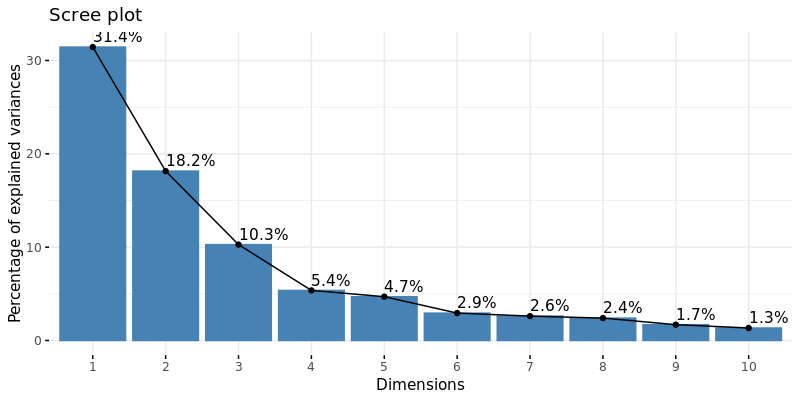

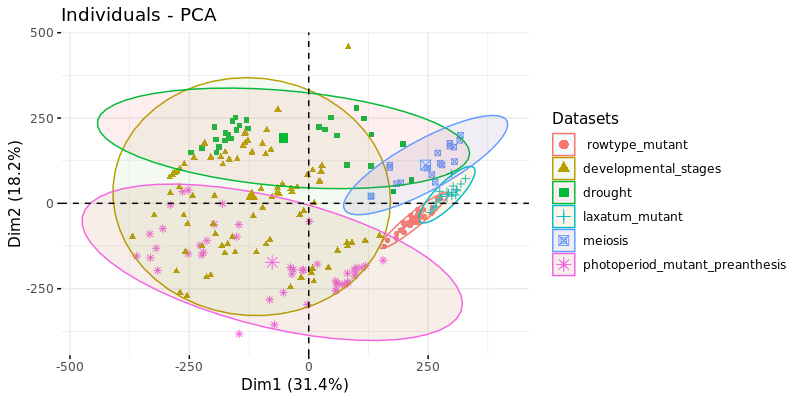

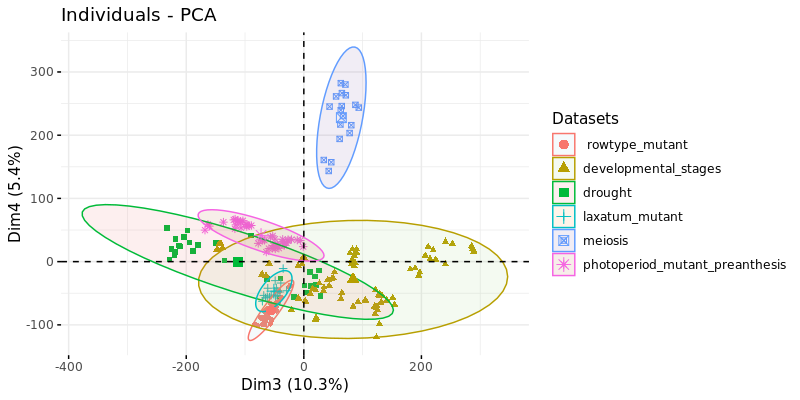

In [101]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 100)
# display eigenvalues
head(log2_pca$eig)
# display scree plot
fviz_eig(log2_pca, addlabels = TRUE)
# display individuals (samples) colored by technical variable
colourCount = length(unique(cnt_log_meta$dataset))
getPalette = colorRampPalette(brewer.pal(18, "Paired"))
fviz_pca_ind(X = log2_pca, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))
fviz_pca_ind(X = log2_pca, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(3, 4), habillage = cnt_log_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))

In [176]:
# build comparism plot variables
a1 <- fviz_pca_ind(X = log2_pca, label = "none", legend.title = "Datasets", title = "", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Datasets", labels = c("Rowtype mutant", "Developmental stages", "Drought", "Laxatum mutant", "Meiosis", "Photoperiod mutant")) +
        scale_shape_manual(name = "Datasets", labels = c("Rowtype mutant", "Developmental stages", "Drought", "Laxatum mutant", "Meiosis", "Photoperiod mutant"), 
                      values = c(15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

a2 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Library type", title = "", addEllipses = TRUE, habillage = cnt_log_meta$library) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Library type", labels = c("Paired read", "Single read")) +
        scale_shape_manual(name = "Library type", labels = c("Paired read", "Single read"), 
                      values = c(15, 16)) +
        guides(fill = FALSE) +
        theme_bw()

a3 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "High level age", title = "", addEllipses = FALSE, habillage = cnt_log_meta$high_level_age) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level age") +
        scale_shape_manual(name = "High-level age", 
                      values = c(15, 16, 17, 18, 19)) +
        guides(fill = FALSE) +
        theme_bw()
#labels = c("Reproductive", "Seedling", "Senescence", "Vegetative")

a4 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "High level tissue", title = "", addEllipses = FALSE, habillage = cnt_log_meta$high_level_tissue) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level tissues", 
                         labels = c("Grain", "Inflorescence", "Leaf", "Meristem", "Root", "Seedling")) +
        scale_shape_manual(name = "High-level tissues", labels = c("Grain", "Inflorescence", "Leaf", "Meristem", "Root", "Seedling"), 
                      values = c(15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

cols <- colorRampPalette(brewer.pal(12, "Paired"))
myPal <- cols(length(unique(cnt_log_meta$intermediate_tissue)))

a5 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Intermediate tissue", title = "", addEllipses = FALSE, habillage = cnt_log_meta$intermediate_tissue) +
        scale_colour_manual(values = myPal, name = "Intermediate tissues", 
                            limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "stamen", "spike",
                                      "grain"),
                            labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Stamen", "Spike",
                                      "Grain")) + 
        scale_shape_manual(name = "Intermediate tissues", 
                           limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "stamen", "spike",
                                      "grain"),
                            labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Stamen", "Spike",
                                      "Grain"),
                      values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

a6 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Intermediate age", title = "", addEllipses = FALSE, habillage = cnt_log_meta$intermediate_age) +
        scale_colour_manual(values = myPal, name = "Intermediate age",
                            limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Heading",
                                       "Anthesis", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Heading",
                                       "Anthesis", "Senescence")) +
        scale_shape_manual(name = "Intermediate age", 
                           limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Heading",
                                       "Anthesis", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Heading",
                                       "Anthesis", "Senescence"),
                      values = c(10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

a7 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Cultivars", title = "", addEllipses = FALSE, habillage = cnt_log_meta$cultivar) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Cultivars",
                        labels = c("Bowman", "BW902", "Golden Promise", "Morex", "S42-IL107",
                                    "SBCC073", "Scarlett")) +
        scale_shape_manual(name = "Cultivars", 
                           labels = c("Bowman", "BW902", "Golden Promise", "Morex", "S42-IL107",
                                    "SBCC073", "Scarlett"),
                      values = c(14, 15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()
#gm
a8 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Genotype", title = "", addEllipses = FALSE, habillage = cnt_log_meta$gm) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Genotype",
                        labels = c("Mutant", "Wild type")) +
        scale_shape_manual(name = "Genotype", labels = c("Mutant", "Wild type"),
                      values = c(15, 16)) +
        guides(fill = FALSE) +
        theme_bw()

#growth condition
a9 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Growth condition", title = "", addEllipses = FALSE, habillage = cnt_log_meta$growth_condition) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Growth condition",
                        labels = c("Greenhouse", "Incubator", "Unknown")) +
        scale_shape_manual(name = "Growth condition", labels = c("Greenhouse", "Incubator", "Unknown"),
                      values = c(14, 15, 16, 17)) +
        guides(fill = FALSE) +
        theme_bw()

Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.


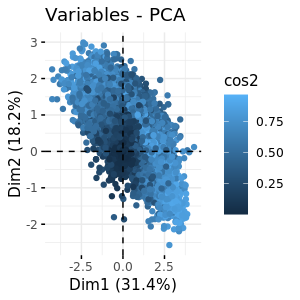

In [34]:
# display variables (genes) colored by quality
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 100)
fviz_pca_var(X = log2_pca, col.var = "cos2", axes = 1:2, label = "none", geom = "point")

# 1.4 **Scaled & centered** PCA on log2-transformed & filtered TPM counts

In [35]:
# scaling and centering data, here it has to happen before the log2 transformation!!
cnt_log2_scaled <- t(bcp_filtered)
cnt_log2_scaled <- as.data.frame(cnt_log2_scaled, stringsAsFactors = FALSE)

# scaling and centering
#cnt_log2_scaled <- cnt_log2_scaled+1

cnt_log2_scaled <- scale(cnt_log2_scaled, center = TRUE, scale = TRUE)
head(cnt_log2_scaled)

# log2
cnt_log2_scaled <- cnt_log2_scaled+2
cnt_log2_scaled <- log2(cnt_log2_scaled)
head(cnt_log2_scaled)
# adding rownames=ID as a column
cnt_log2_scaled <- as.data.frame(cnt_log2_scaled, stringsAsFactors = TRUE)
cnt_log2_scaled <- cbind(ID = rownames(cnt_log2_scaled), cnt_log2_scaled)
rownames(cnt_log2_scaled) <- cnt_log2_scaled$ID
dim(cnt_log2_scaled)
head(cnt_log2_scaled)

,Horvu_MOREX_1H01G000100,Horvu_MOREX_1H01G000200,Horvu_MOREX_1H01G000300,Horvu_MOREX_1H01G000400,Horvu_MOREX_1H01G000500,Horvu_MOREX_1H01G000600,Horvu_MOREX_1H01G000700,Horvu_MOREX_1H01G000800,Horvu_MOREX_1H01G000900,Horvu_MOREX_1H01G001000,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
ERR781039,-0.9202234,-0.3781257,-0.6177755,-0.3227338,-0.7750775,-0.5040000,-0.5984791,-0.9214822,-0.2988352,-0.7653323,⋯,-0.1459607,-0.1986258,-0.17936337,-0.40951020,-0.1418557,-0.2806781,-0.2186038,-0.2122416,-0.5770796,-0.16910644
ERR781040,-1.1285116,-0.3806276,-0.7506979,-0.7678700,-0.9855431,-0.9267391,-0.8178056,-1.2359472,-0.6860706,-0.8704122,⋯,-0.1459607,-0.1986258,-0.03651176,-0.40951020,-0.1994620,-0.4545074,-0.2423654,-0.2122416,0.3982525,-0.02203944
ERR781041,-1.1830169,-0.3806276,-0.7750670,-0.8298971,-1.0131362,-1.0347156,-0.8727876,-1.3267342,-0.7530921,-0.8308527,⋯,-0.1459607,-0.1986258,-0.30924954,-0.40951020,-0.1994620,-0.3675927,-0.2423654,-0.2122416,-0.6398697,-0.16910644
ERR781042,-1.0448070,-0.3781257,-0.6576522,-0.5647614,-0.8692189,-0.8126660,-0.7462358,-1.1451602,-0.5445807,-0.8123092,⋯,-0.1459607,0.8417645,-0.30924954,0.02647103,-0.1546405,-0.4545074,-0.2423654,-0.2122416,-0.3035668,-0.16910644
ERR781043,-0.9027038,-0.3781257,-0.6354985,-0.3239500,-0.7994244,-0.6313773,-0.6324236,-0.9320082,-0.4775592,-0.7665685,⋯,-0.1459607,-0.1986258,-0.18135022,0.32660468,-0.1667076,-0.4545074,-0.2423654,-0.2122416,-0.3818001,-0.16910644
ERR781044,-0.8073195,-0.3781257,-0.5136529,-0.1925984,-0.7323351,-0.4382280,-0.5876623,-0.8806939,-0.3286226,-0.7356626,⋯,-0.1459607,-0.1986258,-0.17001816,-0.40951020,-0.1994620,-0.4545074,-0.2423654,-0.2122416,-0.1734955,-0.16910644


,Horvu_MOREX_1H01G000100,Horvu_MOREX_1H01G000200,Horvu_MOREX_1H01G000300,Horvu_MOREX_1H01G000400,Horvu_MOREX_1H01G000500,Horvu_MOREX_1H01G000600,Horvu_MOREX_1H01G000700,Horvu_MOREX_1H01G000800,Horvu_MOREX_1H01G000900,Horvu_MOREX_1H01G001000,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
ERR781039,0.11073289,0.6976620,0.4669920,0.7461117,0.29269051,0.58111015,0.4869932,0.10904998,0.7665229,0.3041229,⋯,0.8906718,0.8490979,0.8644430,0.6694711,0.8938625,0.7818397,0.8330084,0.8381517,0.5088550,0.8725479
ERR781040,-0.19844657,0.6954348,0.3211223,0.3011545,0.02070761,0.10200084,0.2414673,-0.38825576,0.3938878,0.1757964,⋯,0.8906718,0.8490979,0.9734190,0.6694711,0.8484280,0.6280668,0.8136352,0.8381517,1.2619835,0.9840137
ERR781041,-0.29162183,0.6954348,0.2927028,0.2266354,-0.01907718,-0.05097408,0.1727594,-0.57075184,0.3183549,0.2254567,⋯,0.8906718,0.8490979,0.7576637,0.6694711,0.8484280,0.7070010,0.8136352,0.8381517,0.4437448,0.8725479
ERR781042,-0.06613578,0.6976620,0.4247585,0.5212906,0.17731968,0.24772583,0.3262661,-0.22627408,0.5414348,0.2481593,⋯,0.8906718,1.5067870,0.7576637,1.0189695,0.8839019,0.6280668,0.8136352,0.8381517,0.7625046,0.8725479
ERR781043,0.13395300,0.6976620,0.4483740,0.7450651,0.26372627,0.45272473,0.4516214,0.09490052,0.6063861,0.3026776,⋯,0.8906718,0.8490979,0.8628677,1.2182261,0.8744369,0.6280668,0.8136352,0.8381517,0.6943898,0.8725479
ERR781044,0.25420762,0.6976620,0.5717710,0.8539171,0.34217344,0.64318389,0.4980851,0.16260468,0.7410376,0.3383815,⋯,0.8906718,0.8490979,0.8718293,0.6694711,0.8484280,0.6280668,0.8136352,0.8381517,0.8690853,0.8725479


[1]   240 42776

,ID,Horvu_MOREX_1H01G000100,Horvu_MOREX_1H01G000200,Horvu_MOREX_1H01G000300,Horvu_MOREX_1H01G000400,Horvu_MOREX_1H01G000500,Horvu_MOREX_1H01G000600,Horvu_MOREX_1H01G000700,Horvu_MOREX_1H01G000800,Horvu_MOREX_1H01G000900,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,0.11073289,0.6976620,0.4669920,0.7461117,0.29269051,0.58111015,0.4869932,0.10904998,0.7665229,⋯,0.8906718,0.8490979,0.8644430,0.6694711,0.8938625,0.7818397,0.8330084,0.8381517,0.5088550,0.8725479
ERR781040,ERR781040,-0.19844657,0.6954348,0.3211223,0.3011545,0.02070761,0.10200084,0.2414673,-0.38825576,0.3938878,⋯,0.8906718,0.8490979,0.9734190,0.6694711,0.8484280,0.6280668,0.8136352,0.8381517,1.2619835,0.9840137
ERR781041,ERR781041,-0.29162183,0.6954348,0.2927028,0.2266354,-0.01907718,-0.05097408,0.1727594,-0.57075184,0.3183549,⋯,0.8906718,0.8490979,0.7576637,0.6694711,0.8484280,0.7070010,0.8136352,0.8381517,0.4437448,0.8725479
ERR781042,ERR781042,-0.06613578,0.6976620,0.4247585,0.5212906,0.17731968,0.24772583,0.3262661,-0.22627408,0.5414348,⋯,0.8906718,1.5067870,0.7576637,1.0189695,0.8839019,0.6280668,0.8136352,0.8381517,0.7625046,0.8725479
ERR781043,ERR781043,0.13395300,0.6976620,0.4483740,0.7450651,0.26372627,0.45272473,0.4516214,0.09490052,0.6063861,⋯,0.8906718,0.8490979,0.8628677,1.2182261,0.8744369,0.6280668,0.8136352,0.8381517,0.6943898,0.8725479
ERR781044,ERR781044,0.25420762,0.6976620,0.5717710,0.8539171,0.34217344,0.64318389,0.4980851,0.16260468,0.7410376,⋯,0.8906718,0.8490979,0.8718293,0.6694711,0.8484280,0.6280668,0.8136352,0.8381517,0.8690853,0.8725479


In [36]:
# include metadata table
cnt_meta_log2_scaled <- inner_join(barley_tech_meta, cnt_log2_scaled, by = "ID")
# add rownames again
rownames(cnt_meta_log2_scaled) <- cnt_meta_log2_scaled$ID
dim(cnt_meta_log2_scaled)
head(cnt_meta_log2_scaled)

[1]   240 42789

,ID,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,⋯,0.8906718,0.8490979,0.8644430,0.6694711,0.8938625,0.7818397,0.8330084,0.8381517,0.5088550,0.8725479
ERR781040,ERR781040,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,⋯,0.8906718,0.8490979,0.9734190,0.6694711,0.8484280,0.6280668,0.8136352,0.8381517,1.2619835,0.9840137
ERR781041,ERR781041,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,⋯,0.8906718,0.8490979,0.7576637,0.6694711,0.8484280,0.7070010,0.8136352,0.8381517,0.4437448,0.8725479
ERR781042,ERR781042,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,⋯,0.8906718,1.5067870,0.7576637,1.0189695,0.8839019,0.6280668,0.8136352,0.8381517,0.7625046,0.8725479
ERR781043,ERR781043,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,⋯,0.8906718,0.8490979,0.8628677,1.2182261,0.8744369,0.6280668,0.8136352,0.8381517,0.6943898,0.8725479
ERR781044,ERR781044,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,⋯,0.8906718,0.8490979,0.8718293,0.6694711,0.8484280,0.6280668,0.8136352,0.8381517,0.8690853,0.8725479


In [37]:
# convert variables which are not factor into factor that they could be part of pca
cnt_meta_log2_scaled$rna_input<-factor(cnt_meta_log2_scaled$rna_input)
cnt_meta_log2_scaled$batch<-factor(cnt_meta_log2_scaled$batch)
class(cnt_meta_log2_scaled$rna_input)
class(cnt_meta_log2_scaled$batch)
# change factor levels where extra levels are present from single dataset: inf_dev & tf_q for dataset, 21 for temp
cnt_meta_log2_scaled <- droplevels(cnt_meta_log2_scaled)
# delete ID column to not have it as extra supplementary variable
cnt_meta_log2_scaled <- select(cnt_meta_log2_scaled, -ID)
head(cnt_meta_log2_scaled)

[1] "factor"

[1] "factor"

,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,growth_location,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,Germany,⋯,0.8906718,0.8490979,0.8644430,0.6694711,0.8938625,0.7818397,0.8330084,0.8381517,0.5088550,0.8725479
ERR781040,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,Germany,⋯,0.8906718,0.8490979,0.9734190,0.6694711,0.8484280,0.6280668,0.8136352,0.8381517,1.2619835,0.9840137
ERR781041,photoperiod_mutant_preanthesis,1,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,8_16,22_18,Germany,⋯,0.8906718,0.8490979,0.7576637,0.6694711,0.8484280,0.7070010,0.8136352,0.8381517,0.4437448,0.8725479
ERR781042,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,Germany,⋯,0.8906718,1.5067870,0.7576637,1.0189695,0.8839019,0.6280668,0.8136352,0.8381517,0.7625046,0.8725479
ERR781043,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,Germany,⋯,0.8906718,0.8490979,0.8628677,1.2182261,0.8744369,0.6280668,0.8136352,0.8381517,0.6943898,0.8725479
ERR781044,photoperiod_mutant_preanthesis,2,trizol,Rneasy_microkit_Qiagen,unknown,unknown,incubator,16_8,22_18,Germany,⋯,0.8906718,0.8490979,0.8718293,0.6694711,0.8484280,0.6280668,0.8136352,0.8381517,0.8690853,0.8725479


In [38]:
log2_pca_scaled <- PCA(X = cnt_meta_log2_scaled, scale.unit = FALSE, ncp = 4, quali.sup = c(1:13), graph = F)
#summary(log2_pca_scaled)

,eigenvalue,percentage of variance,cumulative percentage of variance
comp 1,3511.8127,37.244662,37.24466
comp 2,1043.5796,11.067723,48.31239
comp 3,661.0605,7.010903,55.32329
comp 4,449.3523,4.765623,60.08891
comp 5,296.2268,3.141645,63.23056
comp 6,209.2932,2.219667,65.45022


Warning message in brewer.pal(18, "Paired"):
“n too large, allowed maximum for palette Paired is 12
Returning the palette you asked for with that many colors
”

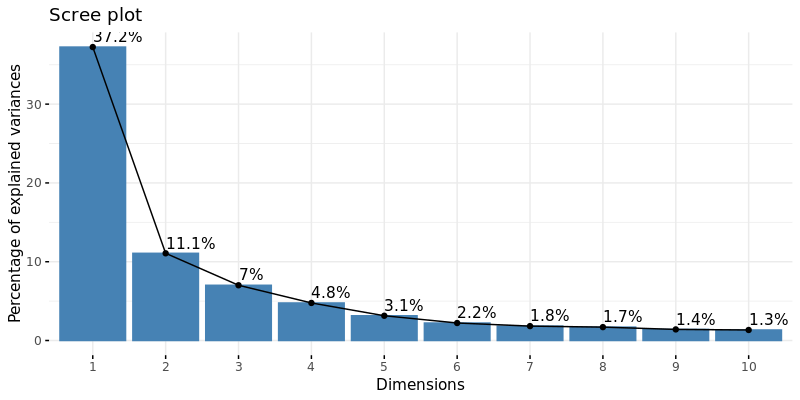

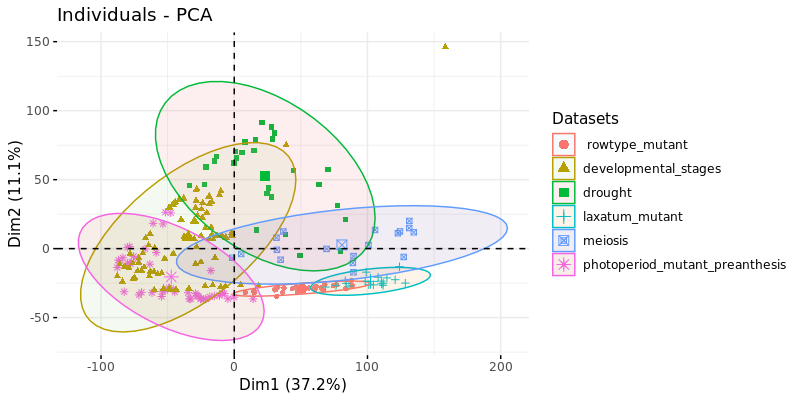

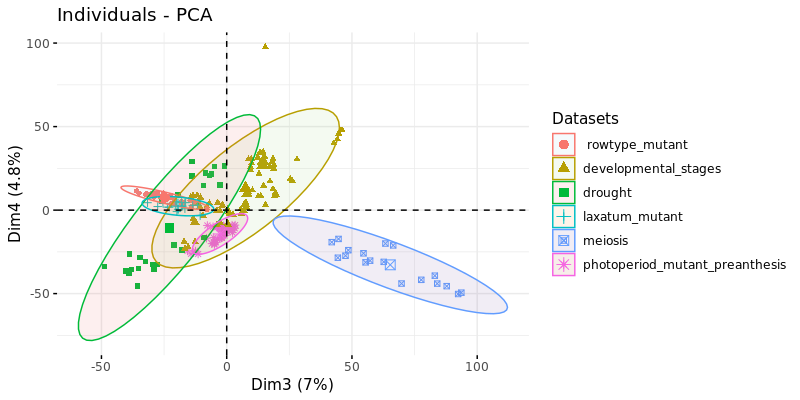

In [39]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 100)
# display eigenvalues
head(log2_pca_scaled$eig)
# display scree plot
fviz_eig(log2_pca_scaled, addlabels = TRUE)
# display individuals (samples) colored by technical variable
colourCount = length(unique(cnt_log_meta$dataset))
getPalette = colorRampPalette(brewer.pal(18, "Paired"))
fviz_pca_ind(X = log2_pca_scaled, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_meta_log2_scaled$dataset) +
                scale_fill_manual(values = getPalette(colourCount))
fviz_pca_ind(X = log2_pca_scaled, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(3, 4), habillage = cnt_meta_log2_scaled$dataset) +
                scale_fill_manual(values = getPalette(colourCount))

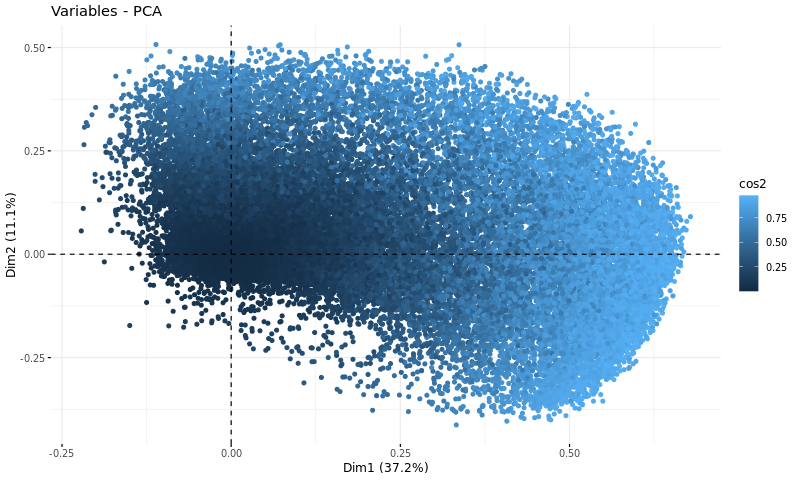

In [40]:
# display variables (genes) colored by quality
options(repr.plot.width = 10, repr.plot.height = 6, repr.plot.res = 80)
fviz_pca_var(X = log2_pca_scaled, col.var = "cos2", axes = 1:2, label = "none", geom = "point")

# 1.5 Summarizing all PCA plots

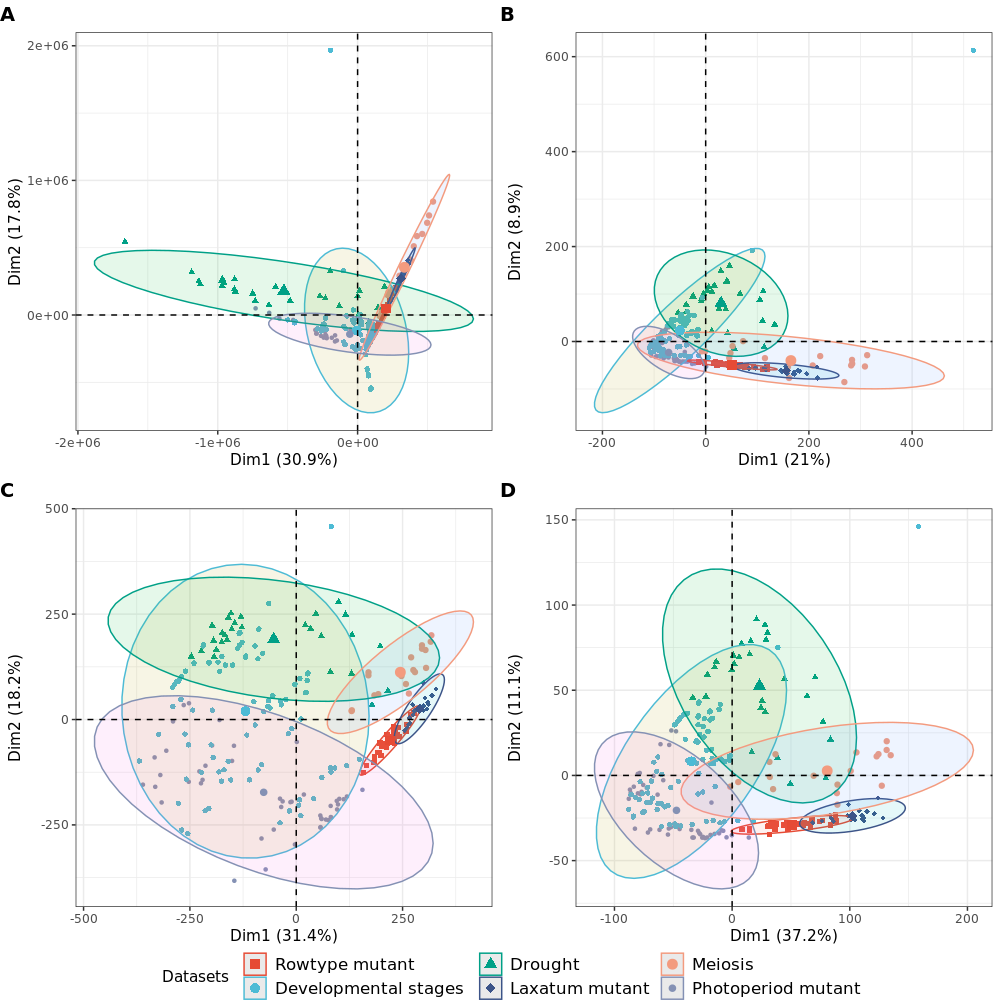

In [226]:
# figure to save
options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 100)
#Raw unscaled PCA
p1 <- fviz_pca_ind(X = raw_pca, label = "none", title = "", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Datasets   ", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant     ", "Meiosis", "Photoperiod mutant")) +
        scale_shape_manual(name = "Datasets   ", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant     ", "Meiosis", "Photoperiod mutant"), 
                      values = c(15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()
#Raw scaled & centered PCA
p2 <- fviz_pca_ind(X = raw_pca_scaled, label = "none", title = "", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Datasets   ", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis")) +
        scale_shape_manual(name = "Datasets   ", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis"), 
                      values = c(15, 16, 17, 18, 19, 20))+
        theme_bw()
#Log2 & filtered unscaled PCA
p3 <- fviz_pca_ind(X = log2_pca, label = "none", title = "", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Datasets   ", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis")) +
        scale_shape_manual(name = "Datasets   ", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis"), 
                      values = c(15, 16, 17, 18, 19, 20)) +
        theme_bw()
#Log2 & filtered, scaled & centered PCA
p4 <- fviz_pca_ind(X = log2_pca_scaled, label = "none", title = "", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Datasets   ", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis")) +
        scale_shape_manual(name = "Datasets   ", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis"), 
                      values = c(15, 16, 17, 18, 19, 20)) +
        theme_bw()

prow1 <- plot_grid(p1 + theme(legend.position="none"),
                  p2 + theme(legend.position="none"),
                  p3 + theme(legend.position="none"),
                  p4 + theme(legend.position="none"),
                  labels=c("A", "B", "C", "D"), align = 'vh', hjust = 0, nrow = 2)

legend1 <- get_legend(p1 + guides(color = guide_legend(nrow = 2)) +
                      theme(legend.position = "bottom", legend.text=element_text(size=12)))
types4 <- plot_grid(prow1, legend1, ncol = 1, rel_heights = c(1, .05))
types4
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
ggsave("pca_4types_barley.pdf", plot = types4, width = 10, height = 10)

# 2. UMAP
## 2.1 UMAP on raw TPM counts

In [42]:
# switching cnt-table rows to columns
umap_cnt<- t(h)
umap_cnt <- as.data.frame(umap_cnt, stringsAsFactors = TRUE)
# adding rownames=ID as a column
umap_cnt <- cbind(ID = rownames(umap_cnt), umap_cnt)
rownames(umap_cnt) <- umap_cnt$ID
dim(umap_cnt)
head(umap_cnt)

[1]   240 49282

,ID,Horvu_MOREX_1H01G000100,Horvu_MOREX_1H01G000200,Horvu_MOREX_1H01G000300,Horvu_MOREX_1H01G000400,Horvu_MOREX_1H01G000500,Horvu_MOREX_1H01G000600,Horvu_MOREX_1H01G000700,Horvu_MOREX_1H01G000800,Horvu_MOREX_1H01G000900,⋯,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110200,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,336,1,116,550,556,707.3084,351.0000,368,72,⋯,0,2.759218,0.000000,7.619365,2,0,1,0,0.1512110,0.00000000
ERR781040,ERR781040,122,0,56,184,167,260.5543,111.9312,129,20,⋯,0,5.793865,0.000000,0.000000,0,0,0,0,2.5000000,0.03942593
ERR781041,ERR781041,66,0,45,133,116,146.4439,52.0000,60,11,⋯,0,0.000000,0.000000,0.000000,1,0,0,0,0.0000000,0.00000000
ERR781042,ERR781042,208,1,98,351,382,381.1077,189.9432,198,39,⋯,1,0.000000,1.507178,5.928367,0,0,0,0,0.8098828,0.00000000
ERR781043,ERR781043,354,1,108,549,511,572.6950,314.0000,360,48,⋯,0,2.717011,2.544734,4.332308,0,0,0,0,0.6214817,0.00000000
ERR781044,ERR781044,452,1,163,657,635,776.8168,362.7905,399,68,⋯,0,2.957741,0.000000,0.000000,0,0,0,0,1.1231197,0.00000000


In [43]:
# include metadata table
umap_meta <- inner_join(barley_meta, umap_cnt, by = "ID")
# add rownames again
rownames(umap_meta) <- umap_meta$ID
dim(umap_meta)
head(umap_meta)

[1]   240 49303

,ID,dataset,batch,cultivar,gm,zadoc_scale,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,⋯,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110200,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<int>,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,photoperiod_mutant_preanthesis,1,S42-IL107,wt,9,Germination,Seedling,apex,meristem,⋯,0,2.759218,0.000000,7.619365,2,0,1,0,0.1512110,0.00000000
ERR781040,ERR781040,photoperiod_mutant_preanthesis,1,S42-IL107,wt,9,Germination,Seedling,apex,meristem,⋯,0,5.793865,0.000000,0.000000,0,0,0,0,2.5000000,0.03942593
ERR781041,ERR781041,photoperiod_mutant_preanthesis,1,S42-IL107,wt,9,Germination,Seedling,apex,meristem,⋯,0,0.000000,0.000000,0.000000,1,0,0,0,0.0000000,0.00000000
ERR781042,ERR781042,photoperiod_mutant_preanthesis,2,Scarlett,mut,11,Leaf_development,Vegetative,apex,meristem,⋯,1,0.000000,1.507178,5.928367,0,0,0,0,0.8098828,0.00000000
ERR781043,ERR781043,photoperiod_mutant_preanthesis,2,Scarlett,mut,11,Leaf_development,Vegetative,apex,meristem,⋯,0,2.717011,2.544734,4.332308,0,0,0,0,0.6214817,0.00000000
ERR781044,ERR781044,photoperiod_mutant_preanthesis,2,Scarlett,mut,11,Leaf_development,Vegetative,apex,meristem,⋯,0,2.957741,0.000000,0.000000,0,0,0,0,1.1231197,0.00000000


In [44]:
umap_data = umap_meta[, grep("Horvu", colnames(umap_meta))]
umap_labels = umap_meta[1:22]
#create umap table
u <- umap(umap_data)
u
#inspect table
head(u$layout, 3)

umap embedding of 240 items in 2 dimensions
object components: layout, data, knn, config


ERR781039,-1.615282,2.1542235
ERR781040,-6.174047,-0.6676270
ERR781041,-6.198738,-0.8197829


In [45]:
udf <- as.data.frame(u$layout)
glimpse(udf)

Rows: 240
Columns: 2
$ V1 <dbl> -1.615282, -6.174047, -6.198738, -6.025771, -1.879442, -1.480662, …
$ V2 <dbl> 2.1542235, -0.6676270, -0.8197829, -0.3004693, 2.0685894, 2.297561…


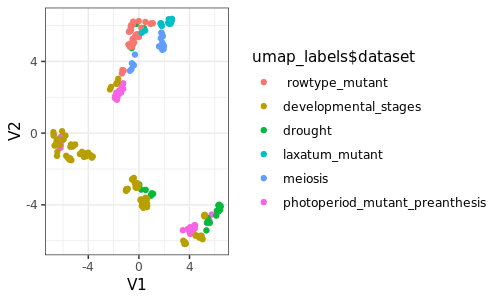

In [46]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 100)
ggplot(udf, aes(x = V1, y = V2, color = umap_labels$dataset)) +
  geom_point()

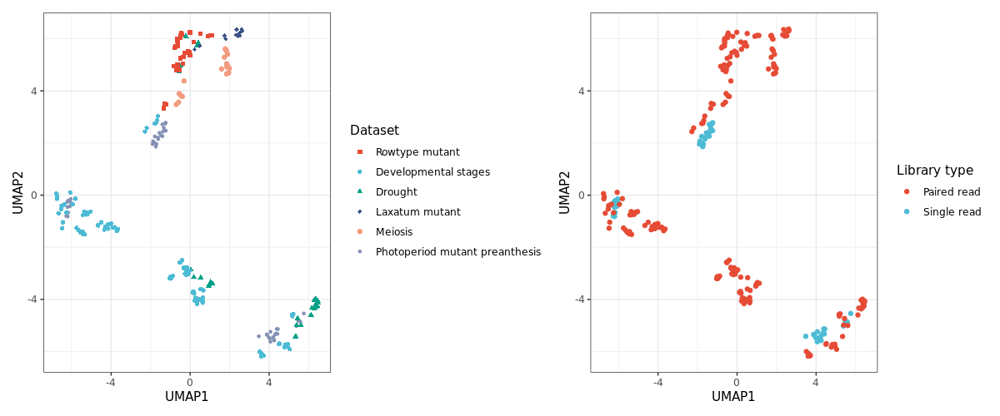

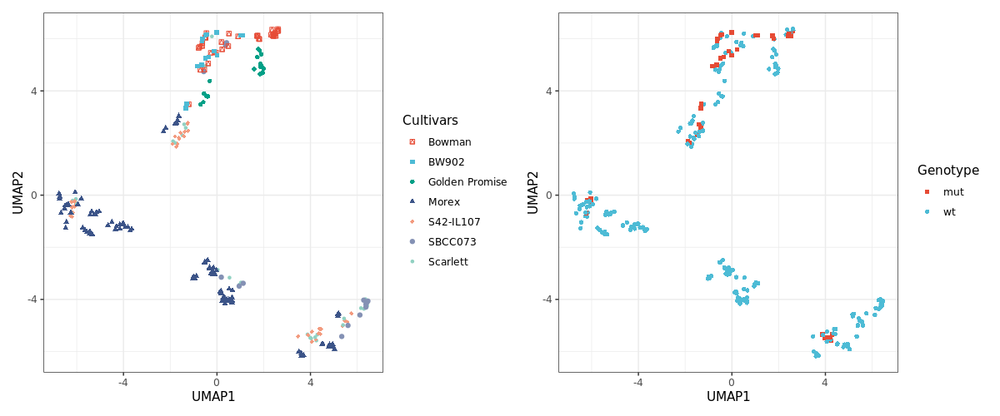

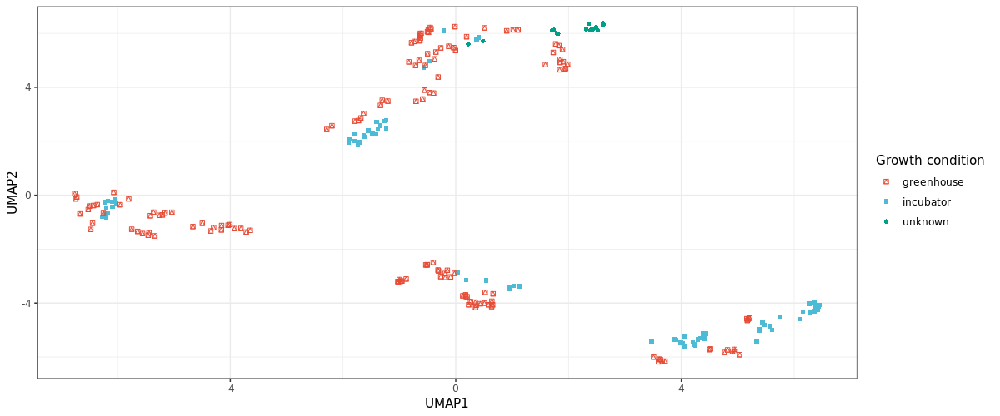

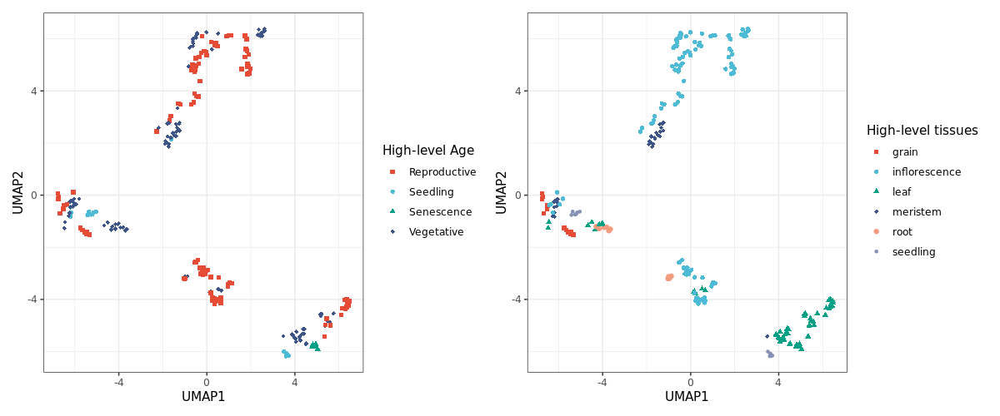

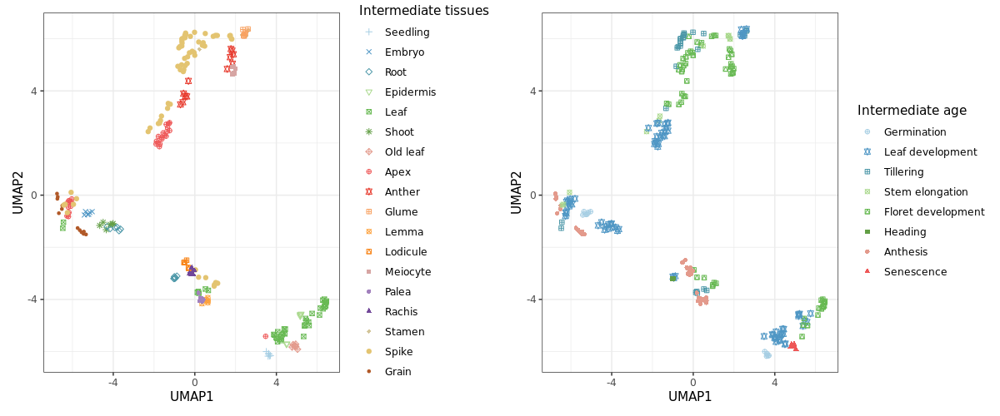

In [190]:
options(repr.plot.width = 12, repr.plot.height = 5, repr.plot.res = 100)
rb1 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$dataset, shape = umap_labels_log$dataset)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_color_npg(palette = c("nrc"), alpha = 1, name = "Dataset", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis")) +
                scale_shape_manual(name = "Dataset", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis"), 
                      values = c(15, 16, 17, 18, 19, 20)) +
                theme_bw()
rb2 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$library, shaper = umap_labels_log$library)) +
                  geom_point() +
                xlab("UMAP1") + 
                ylab("UMAP2") +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Library type", labels = c("Paired read", "Single read")) +
                scale_shape_manual(name = "Library type", labels = c("Paired read", "Single read")) +
                theme_bw()
rb3 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$high_level_age, shape = umap_labels_log$high_level_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level Age") +
                scale_shape_manual(name = "High-level Age", values = c(15, 16, 17, 18, 19)) +
                theme_bw()
rb4 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$high_level_tissue, shape = umap_labels_log$high_level_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level tissues") +
                scale_shape_manual(name = "High-level tissues", 
                      values = c(15, 16, 17, 18, 19, 20)) +
                theme_bw()
rb5 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$intermediate_tissue, shape = umap_labels_log$intermediate_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = myPal,  name = "Intermediate tissues", 
                                    limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "stamen", "spike", 
                                      "grain"),
                                    labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Stamen","Spike", 
                                      "Grain")) +
                scale_shape_manual(name = "Intermediate tissues",
                                   limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "stamen", "spike", 
                                      "grain"),
                                   labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Stamen", "Spike", 
                                      "Grain"),
                                   values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw() 


rb6 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$intermediate_age, shape = umap_labels_log$intermediate_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = myPal, name = "Intermediate age", 
                                    limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Heading",
                                       "Anthesis", "Senescence"),
                                    labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Heading",
                                       "Anthesis", "Senescence")) +
                scale_shape_manual(name = "Intermediate age", 
                                   limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Heading",
                                       "Anthesis", "Senescence"),
                                   labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Heading",
                                       "Anthesis", "Senescence"),
                                   values = c(10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw()

rb7 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$cultivar, shape = umap_labels_log$cultivar)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Cultivars") +
                scale_shape_manual(name = "Cultivars", 
                      values = c(14, 15, 16, 17, 18, 19, 20)) +
                theme_bw()

#gm
rb8 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$gm, shape = umap_labels_log$gm)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Genotype") +
                scale_shape_manual(name = "Genotype", 
                      values = c(15, 16)) +
                theme_bw()

#growth condition
rb9 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$growth_condition, shape = umap_labels_log$growth_condition)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Growth condition") +
                scale_shape_manual(name = "Growth condition", 
                      values = c(14, 15, 16, 17)) +
                theme_bw()
rb1 + rb2 
rb7 + rb8
rb9
rb3 + rb4 
rb5 + rb6

## 2.2 UMAP on raw & filtered TPMs

In [193]:
# switching cnt-table rows to columns
umap_cnt_f<- t(bcp_filtered)
umap_cnt_f <- as.data.frame(umap_cnt_f, stringsAsFactors = TRUE)
# adding rownames=ID as a column
umap_cnt_f <- cbind(ID = rownames(umap_cnt_f), umap_cnt_f)
rownames(umap_cnt_f) <- umap_cnt_f$ID
dim(umap_cnt_f)
head(umap_cnt_f)

[1]   240 42776

,ID,Horvu_MOREX_1H01G000100,Horvu_MOREX_1H01G000200,Horvu_MOREX_1H01G000300,Horvu_MOREX_1H01G000400,Horvu_MOREX_1H01G000500,Horvu_MOREX_1H01G000600,Horvu_MOREX_1H01G000700,Horvu_MOREX_1H01G000800,Horvu_MOREX_1H01G000900,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,336,1,116,550,556,707.3084,351.0000,368,72,⋯,0,0,2.759218,0.000000,7.619365,2,1,0,0.1512110,0.00000000
ERR781040,ERR781040,122,0,56,184,167,260.5543,111.9312,129,20,⋯,0,0,5.793865,0.000000,0.000000,0,0,0,2.5000000,0.03942593
ERR781041,ERR781041,66,0,45,133,116,146.4439,52.0000,60,11,⋯,0,0,0.000000,0.000000,0.000000,1,0,0,0.0000000,0.00000000
ERR781042,ERR781042,208,1,98,351,382,381.1077,189.9432,198,39,⋯,0,1,0.000000,1.507178,5.928367,0,0,0,0.8098828,0.00000000
ERR781043,ERR781043,354,1,108,549,511,572.6950,314.0000,360,48,⋯,0,0,2.717011,2.544734,4.332308,0,0,0,0.6214817,0.00000000
ERR781044,ERR781044,452,1,163,657,635,776.8168,362.7905,399,68,⋯,0,0,2.957741,0.000000,0.000000,0,0,0,1.1231197,0.00000000


In [195]:
# include metadata table
umap_f_meta <- inner_join(barley_meta, umap_cnt_f, by = "ID")
# add rownames again
rownames(umap_f_meta) <- umap_f_meta$ID
dim(umap_f_meta)
head(umap_f_meta)

[1]   240 42797

,ID,dataset,batch,cultivar,gm,zadoc_scale,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<int>,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,ERR781039,photoperiod_mutant_preanthesis,1,S42-IL107,wt,9,Germination,Seedling,apex,meristem,⋯,0,0,2.759218,0.000000,7.619365,2,1,0,0.1512110,0.00000000
ERR781040,ERR781040,photoperiod_mutant_preanthesis,1,S42-IL107,wt,9,Germination,Seedling,apex,meristem,⋯,0,0,5.793865,0.000000,0.000000,0,0,0,2.5000000,0.03942593
ERR781041,ERR781041,photoperiod_mutant_preanthesis,1,S42-IL107,wt,9,Germination,Seedling,apex,meristem,⋯,0,0,0.000000,0.000000,0.000000,1,0,0,0.0000000,0.00000000
ERR781042,ERR781042,photoperiod_mutant_preanthesis,2,Scarlett,mut,11,Leaf_development,Vegetative,apex,meristem,⋯,0,1,0.000000,1.507178,5.928367,0,0,0,0.8098828,0.00000000
ERR781043,ERR781043,photoperiod_mutant_preanthesis,2,Scarlett,mut,11,Leaf_development,Vegetative,apex,meristem,⋯,0,0,2.717011,2.544734,4.332308,0,0,0,0.6214817,0.00000000
ERR781044,ERR781044,photoperiod_mutant_preanthesis,2,Scarlett,mut,11,Leaf_development,Vegetative,apex,meristem,⋯,0,0,2.957741,0.000000,0.000000,0,0,0,1.1231197,0.00000000


In [196]:
umap_f_data = umap_f_meta[, grep("Horvu", colnames(umap_f_meta))]
umap_f_labels = umap_f_meta[1:22]
#create umap table
uf <- umap(umap_f_data)
uf
#inspect table
head(uf$layout, 3)

umap embedding of 240 items in 2 dimensions
object components: layout, data, knn, config


ERR781039,-2.925038,2.829966
ERR781040,-5.384862,1.248414
ERR781041,-5.497576,1.307085


In [197]:
urf <- as.data.frame(uf$layout)
glimpse(urf)

Rows: 240
Columns: 2
$ V1 <dbl> -2.925038, -5.384862, -5.497576, -5.244004, -3.185289, -2.696463, …
$ V2 <dbl> 2.829966, 1.248414, 1.307085, 1.591612, 2.717937, 3.097606, 3.0091…


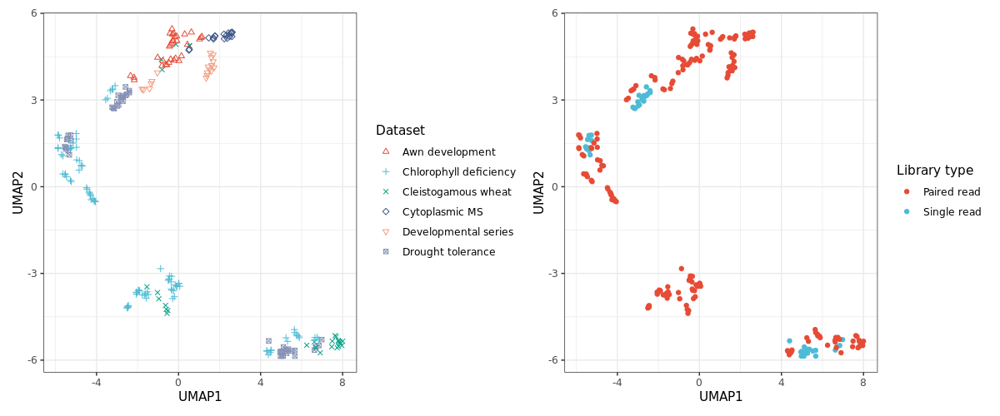

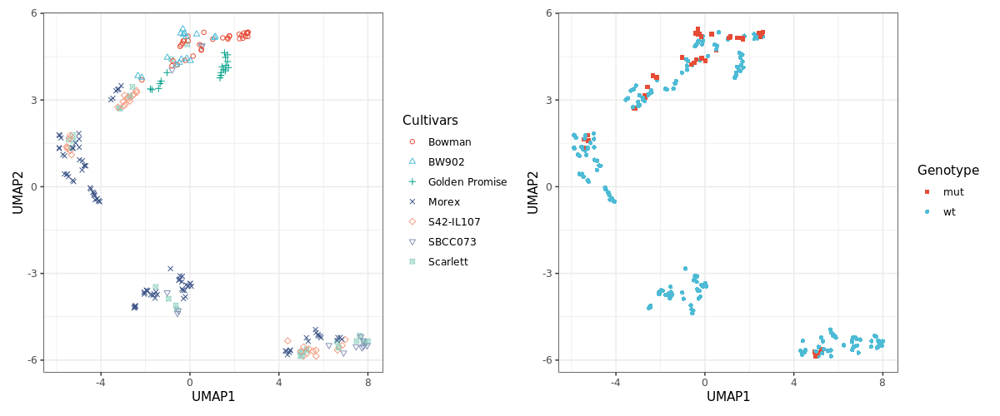

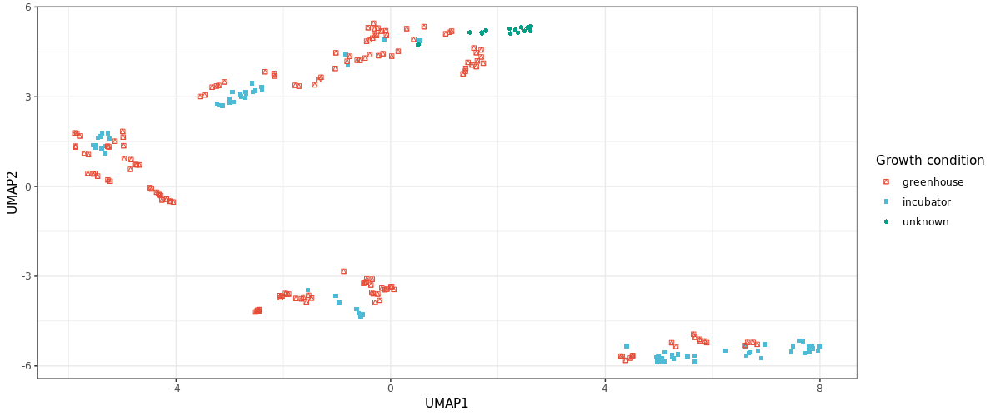

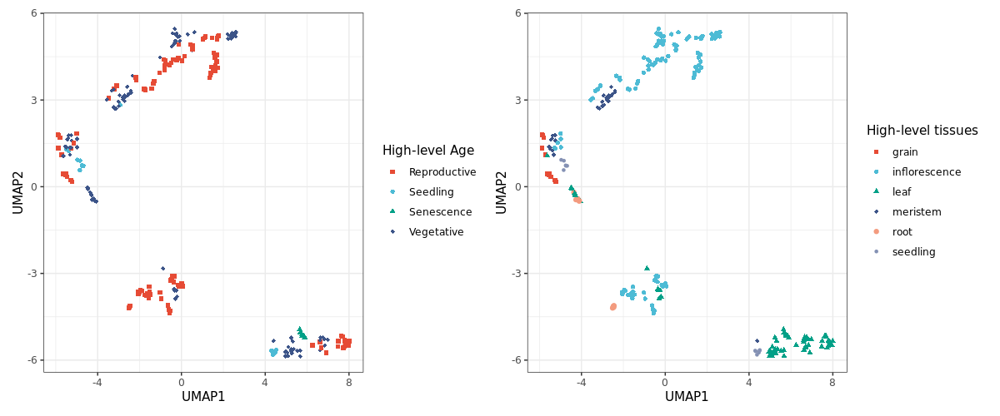

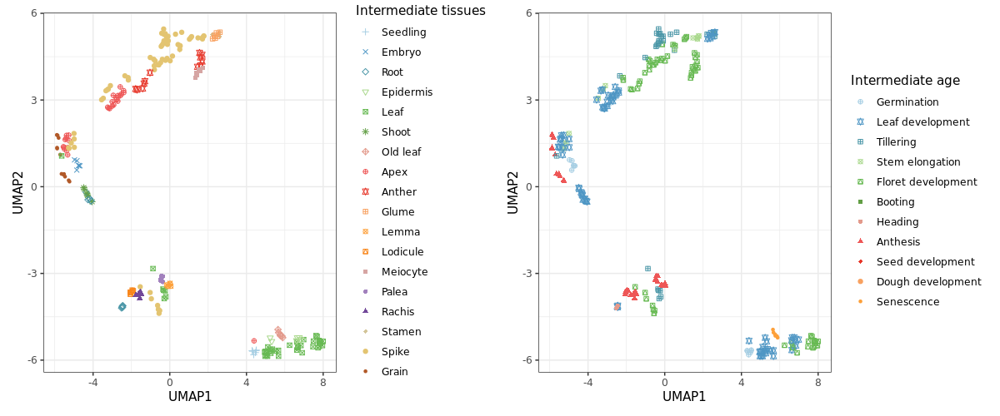

In [214]:
options(repr.plot.width = 12, repr.plot.height = 5, repr.plot.res = 100)
rfb1 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$dataset, shape = umap_labels_log$dataset)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_color_npg(palette = c("nrc"), alpha = 1, name = "Dataset",
                               labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q")) +
                scale_shape_manual(name = "Dataset", 
                                   labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q"),
                      values = c(2,3,4,5,6,7,8,9,10,11,12,13,14,15, 16, 17, 18, 19, 20)) +
                theme_bw()
rfb2 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$library, shaper = umap_labels_log$library)) +
                  geom_point() +
                xlab("UMAP1") + 
                ylab("UMAP2") +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Library type", labels = c("Paired read", "Single read")) +
                scale_shape_manual(name = "Library type", labels = c("Paired read", "Single read")) +
                theme_bw()
rfb3 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$high_level_age, shape = umap_labels_log$high_level_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level Age") +
                scale_shape_manual(name = "High-level Age", values = c(15, 16, 17, 18, 19)) +
                theme_bw()
rfb4 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$high_level_tissue, shape = umap_labels_log$high_level_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level tissues") +
                scale_shape_manual(name = "High-level tissues", 
                      values = c(15, 16, 17, 18, 19, 20)) +
                theme_bw()
rfb5 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$intermediate_tissue, shape = umap_labels_log$intermediate_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = myPal,  name = "Intermediate tissues", 
                                    limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "stamen", "spike", 
                                      "grain"),
                                    labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Stamen","Spike", 
                                      "Grain")) +
                scale_shape_manual(name = "Intermediate tissues",
                                   limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "stamen", "spike", 
                                      "grain"),
                                   labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Stamen", "Spike", 
                                      "Grain"),
                                   values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw() 

rfb6 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$intermediate_age, shape = umap_labels_log$intermediate_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = myPal, name = "Intermediate age",
                                   limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence")) +
                scale_shape_manual(name = "Intermediate age",
                                   limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence"),
                                   values = c(10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw()

rfb7 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$cultivar, shape = umap_labels_log$cultivar)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Cultivars") +
                scale_shape_manual(name = "Cultivars", 
                      values = c(1,2,3,4,5,6,7,8,9,10,11,12,13,14, 15, 16, 17, 18, 19, 20,21,22)) +
                theme_bw()

#gm
rfb8 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$gm, shape = umap_labels_log$gm)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Genotype") +
                scale_shape_manual(name = "Genotype", 
                      values = c(15, 16)) +
                theme_bw()

#growth condition
rfb9 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$growth_condition, shape = umap_labels_log$growth_condition)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Growth condition") +
                scale_shape_manual(name = "Growth condition", 
                      values = c(14, 15, 16, 17)) +
                theme_bw()
rfb1 + rfb2 
rfb7 + rfb8
rfb9
rfb3 + rfb4 
rfb5 + rfb6

## 2.3 UMAP on log2 & filtered TPMs

In [154]:
dim(cnt_log_meta)
head(cnt_log_meta)

[1]   240 42785

,dataset,cultivar,instrument,library,gm,growth_condition,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,photoperiod_mutant_preanthesis,S42-IL107,Illumina HiSeq 2000,single,wt,incubator,Germination,Seedling,apex,meristem,⋯,0,0,1.910433,0.000000,3.107582,1.584963,1,0,0.2031522,0.00000000
ERR781040,photoperiod_mutant_preanthesis,S42-IL107,Illumina HiSeq 2000,single,wt,incubator,Germination,Seedling,apex,meristem,⋯,0,0,2.764233,0.000000,0.000000,0.000000,0,0,1.8073549,0.05578695
ERR781041,photoperiod_mutant_preanthesis,S42-IL107,Illumina HiSeq 2000,single,wt,incubator,Germination,Seedling,apex,meristem,⋯,0,0,0.000000,0.000000,0.000000,1.000000,0,0,0.0000000,0.00000000
ERR781042,photoperiod_mutant_preanthesis,Scarlett,Illumina HiSeq 2000,single,mut,incubator,Leaf_development,Vegetative,apex,meristem,⋯,0,1,0.000000,1.326065,2.792515,0.000000,0,0,0.8558963,0.00000000
ERR781043,photoperiod_mutant_preanthesis,Scarlett,Illumina HiSeq 2000,single,mut,incubator,Leaf_development,Vegetative,apex,meristem,⋯,0,0,1.894143,1.825677,2.414760,0.000000,0,0,0.6973128,0.00000000
ERR781044,photoperiod_mutant_preanthesis,Scarlett,Illumina HiSeq 2000,single,mut,incubator,Leaf_development,Vegetative,apex,meristem,⋯,0,0,1.984677,0.000000,0.000000,0.000000,0,0,1.0861857,0.00000000


In [155]:
umap_data_log = cnt_log_meta[, grep("Horvu", colnames(cnt_log_meta))]
umap_labels_log = cnt_log_meta[1:13]

In [156]:
u_log <- umap(umap_data_log)
u_log

umap embedding of 240 items in 2 dimensions
object components: layout, data, knn, config


In [157]:
u_log_df <- as.data.frame(u_log$layout)
glimpse(u_log_df)

Rows: 240
Columns: 2
$ V1 <dbl> -7.301144, -7.483663, -7.420059, -7.462858, -7.307404, -7.163108, …
$ V2 <dbl> -6.574899, -5.958540, -5.842637, -6.327948, -6.617925, -6.790965, …


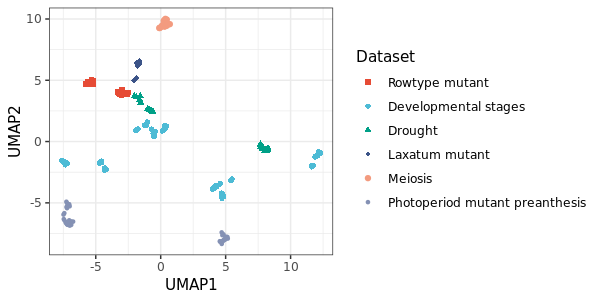

In [220]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 100)
b1 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$dataset, shape = umap_labels_log$dataset)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_color_npg(palette = c("nrc"), alpha = 1, name = "Dataset", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis")) +
                scale_shape_manual(name = "Dataset", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis"), 
                      values = c(15, 16, 17, 18, 19, 20)) +
                theme_bw()
b1
b2 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$library, shaper = umap_labels_log$library)) +
                  geom_point() +
                xlab("UMAP1") + 
                ylab("UMAP2") +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Library type", labels = c("Paired read", "Single read")) +
                scale_shape_manual(name = "Library type", labels = c("Paired read", "Single read")) +
                theme_bw()
b3 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$high_level_age, shape = umap_labels_log$high_level_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level Age") +
                scale_shape_manual(name = "High-level Age", values = c(15, 16, 17, 18, 19)) +
                theme_bw()
b4 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$high_level_tissue, shape = umap_labels_log$high_level_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level tissues  ",
                                labels = c("Grain", "Inflorescence ", "Leaf", "Meristem", "Root", "Seedling")) +
                scale_shape_manual(name = "High-level tissues  ", labels = c("Grain", "Inflorescence ", "Leaf", "Meristem", "Root", "Seedling"),
                      values = c(15, 16, 17, 18, 19, 20)) +
                theme_bw()
b5 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$intermediate_tissue, shape = umap_labels_log$intermediate_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = myPal,  name = "Intermediate tissues", 
                                    limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "stamen", "spike", 
                                      "grain"),
                                    labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Stamen","Spike", 
                                      "Grain")) +
                scale_shape_manual(name = "Intermediate tissues",
                                   limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "stamen", "spike", 
                                      "grain"),
                                   labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Stamen", "Spike", 
                                      "Grain"),
                                   values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw() 


b6 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$intermediate_age, shape = umap_labels_log$intermediate_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = myPal, name = "Intermediate age", 
                                    limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Heading",
                                       "Anthesis", "Senescence"),
                                    labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Heading",
                                       "Anthesis", "Senescence")) +
                scale_shape_manual(name = "Intermediate age", 
                                   limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Heading",
                                       "Anthesis", "Senescence"),
                                   labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Heading",
                                       "Anthesis", "Senescence"),
                                   values = c(10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw()

b7 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$cultivar, shape = umap_labels_log$cultivar)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Cultivars") +
                scale_shape_manual(name = "Cultivars", 
                      values = c(14, 15, 16, 17, 18, 19, 20)) +
                theme_bw()

#gm
b8 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$gm, shape = umap_labels_log$gm)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Genotype") +
                scale_shape_manual(name = "Genotype", 
                      values = c(15, 16)) +
                theme_bw()

#growth condition
b9 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$growth_condition, shape = umap_labels_log$growth_condition)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Growth condition") +
                scale_shape_manual(name = "Growth condition", 
                      values = c(14, 15, 16, 17)) +
                theme_bw()

In [244]:
# save objects for figure creation
setwd("/home/vanda.marosi/floral_development_thesis_vm/")
saveRDS(cnt_log_meta, file = "cnt_log_meta_barley.rds")

# 2.4 UMAP comparism figure

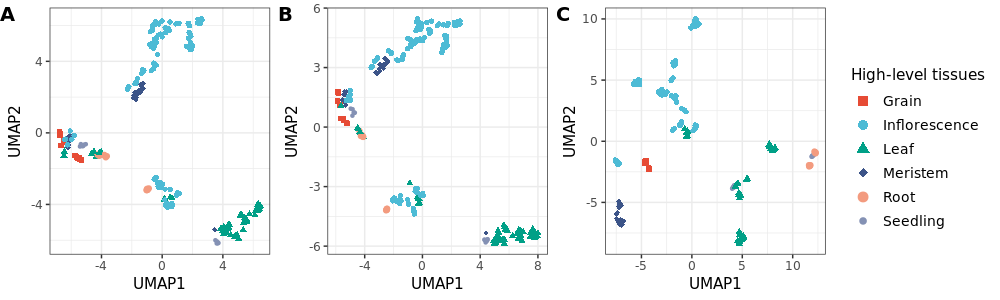

In [241]:
# figure to save
options(repr.plot.width = 10, repr.plot.height = 3, repr.plot.res = 100)

prow1 <- plot_grid(rb4 + theme(legend.position="none"),
                  rfb4 + theme(legend.position="none"),
                  b4 + theme(legend.position="none"),
                  labels=c("A", "B", "C"), align = 'vh', hjust = 0, nrow = 1)

legend1 <- get_legend(b4 + guides(color = guide_legend(ncol = 1), shape = guide_legend(override.aes = list(size = 3))) +
                      theme(legend.position = "right", legend.text=element_text(size=10)))
types4 <- plot_grid(prow1, legend1, ncol = 2, rel_widths = c(1, 0.2))
types4
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
ggsave("umap_3types_barley_hightissue.pdf", plot = types4, width = 10, height = 3)

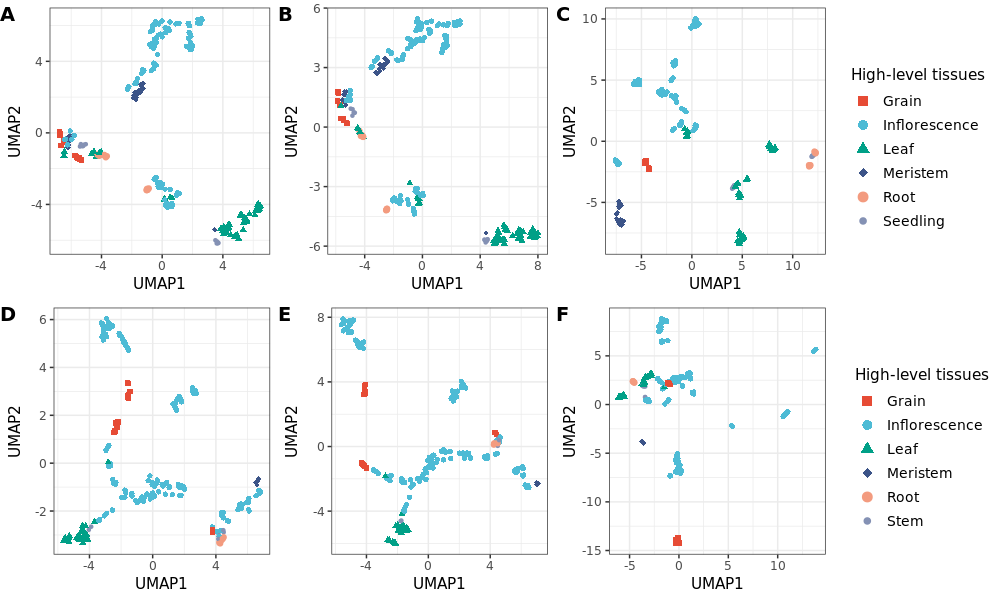

In [236]:
setwd("/home/vanda.marosi/floral_development_thesis_vm/")
trit_umap <- readRDS("umap_wheat_3types.rds")
options(repr.plot.width = 10, repr.plot.height = 6, repr.plot.res = 100)

combined <- plot_grid(types4, trit_umap, nrow = 2)
combined
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
ggsave("umap_combined.pdf", plot = combined, width = 10, height = 6)

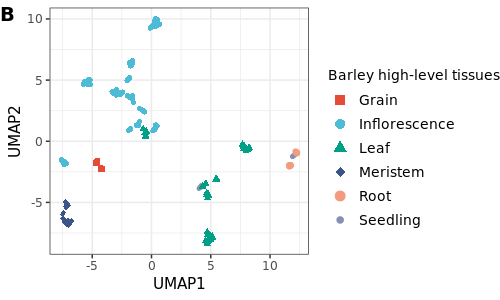

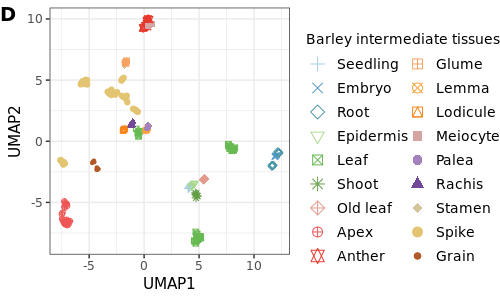

In [266]:
# create tissue meta figure
b4_a <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$high_level_tissue, shape = umap_labels_log$high_level_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Barley high-level tissues  ",
                                labels = c("Grain", "Inflorescence ", "Leaf", "Meristem", "Root", "Seedling")) +
                scale_shape_manual(name = "Barley high-level tissues  ", labels = c("Grain", "Inflorescence ", "Leaf", "Meristem", "Root", "Seedling"),
                      values = c(15, 16, 17, 18, 19, 20)) +
                theme_bw()
b5_a <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$intermediate_tissue, shape = umap_labels_log$intermediate_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = myPal,  name = "Barley intermediate tissues", 
                                    limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "stamen", "spike", 
                                      "grain"),
                                    labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Stamen","Spike", 
                                      "Grain")) +
                scale_shape_manual(name = "Barley intermediate tissues",
                                   limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "stamen", "spike", 
                                      "grain"),
                                   labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Stamen", "Spike", 
                                      "Grain"),
                                   values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw() 

options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 100)

prow1 <- plot_grid(b4_a + theme(legend.position="none"), labels=c("B"), align = 'vh', hjust = 0, nrow = 1)
legend1 <- get_legend(b4_a + guides(color = guide_legend(ncol = 1), shape = guide_legend(override.aes = list(size = 3))) +
                      theme(legend.position = "right", legend.text=element_text(size=10), legend.title=element_text(size=10)))
alone_b4 <- plot_grid(prow1, legend1, ncol = 2, rel_widths = c(1, 0.58))
alone_b4
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
ggsave("umap_b4_barley.pdf", plot = alone_b4, width = 5, height = 3)

options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 100)

prow1 <- plot_grid(b5_a + theme(legend.position="none"), labels=c("D"), align = 'vh', hjust = 0, nrow = 1)
legend1 <- get_legend(b5_a + guides(color = guide_legend(ncol = 2), shape = guide_legend(override.aes = list(size = 3))) +
                      theme(legend.position = "right", legend.text=element_text(size=10), legend.title=element_text(size=10)))
alone_b5 <- plot_grid(prow1, legend1, ncol = 2, rel_widths = c(1, 0.68))
alone_b5
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
ggsave("umap_b5_barley.pdf", plot = alone_b5, width = 5, height = 3)

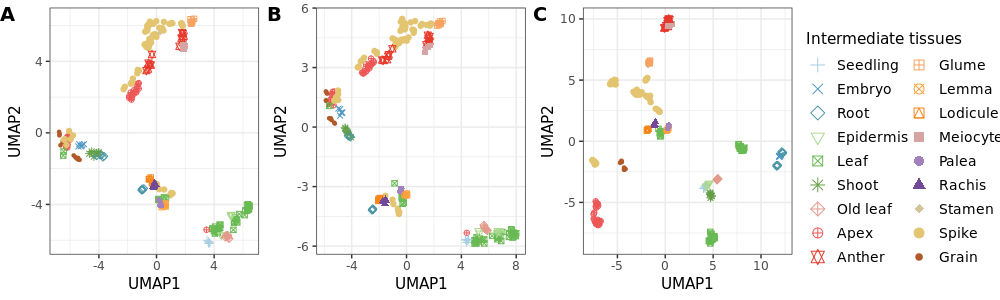

In [228]:
# figure to save
options(repr.plot.width = 10, repr.plot.height = 3, repr.plot.res = 100)

prow1 <- plot_grid(rb5 + theme(legend.position="none"),
                  rfb5 + theme(legend.position="none"),
                  b5 + theme(legend.position="none"),
                  labels=c("A", "B", "C"), align = 'vh', hjust = 0, nrow = 1)

legend1 <- get_legend(b5 + guides(color = guide_legend(ncol = 2), shape = guide_legend(override.aes = list(size = 3))) +
                      theme(legend.position = "right", legend.text=element_text(size=10)))
types4 <- plot_grid(prow1, legend1, ncol = 2, rel_widths = c(1, 0.25))
types4
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
ggsave("umap_4types_barley_inttissue.pdf", plot = types4, width = 10, height = 3)

# 3. ELC on filtered TPM counts

In [52]:
#Calculating ELC on filtered but NOT! log-transformed counts
dim(bcp_filtered)
#head(bcp_filtered)
elc_cnt <- as.data.frame(bcp_filtered)
#elc_cnt <- select(elc_cnt, -ID)
#elc_cnt <- t(elc_cnt)
head(elc_cnt)

[1] 42775   240

,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,ERR781048,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Horvu_MOREX_1H01G000100,336.0000,122.0000,66.0000,208.0000,354.000,452.0000,388.0000,405.0000,359.0000,657.000,⋯,1232.000,2237.000,1503.000,1833.000,1695.000,2477.000,2265.000,2578.000,2468.000,2317.000
Horvu_MOREX_1H01G000200,1.0000,0.0000,0.0000,1.0000,1.000,1.0000,1.0000,0.0000,0.0000,1.000,⋯,1.000,3.000,10.000,1.000,2.000,8.000,6.000,0.000,2.000,2.000
Horvu_MOREX_1H01G000300,116.0000,56.0000,45.0000,98.0000,108.000,163.0000,160.0000,133.0000,117.0000,284.000,⋯,428.000,610.000,519.000,466.000,492.000,652.000,569.000,677.000,710.000,584.000
Horvu_MOREX_1H01G000400,550.0000,184.0000,133.0000,351.0000,549.000,657.0000,577.0000,605.0000,540.0000,1183.000,⋯,971.000,1640.000,1312.000,1160.000,2093.000,2738.000,2795.000,3687.000,3044.000,3045.000
Horvu_MOREX_1H01G000500,556.0000,167.0000,116.0000,382.0000,511.000,635.0000,772.0000,607.0000,630.0000,1166.000,⋯,3656.000,4336.000,4734.000,4469.000,2296.000,2418.000,2349.000,3908.000,3340.000,3221.000
Horvu_MOREX_1H01G000600,707.3084,260.5543,146.4439,381.1077,572.695,776.8168,827.0809,874.5452,566.1862,1397.799,⋯,2808.661,3316.393,2766.549,2833.275,2984.255,4250.868,3915.629,4172.974,4106.843,4045.146


In [53]:
non.expr.cutoff=0.5

get_elc=function(x,cut) {
    s=elc_cnt
    sx=x[x>cut]
    k=kmeans(log(sx+cut),4)
    kk=ordered(k$cluster,levels=order(k$centers))
    levels(kk)=paste("E",1:4,sep="")
    so=ordered(rep("E0",nrow(s)),levels=paste("E",0:4,sep=""))
    so[x>cut]=kk
    so
}
log_elc=apply(elc_cnt,2,get_elc,non.expr.cutoff)
colnames(log_elc)=colnames(elc_cnt)
rownames(log_elc)=rownames(elc_cnt)
head(log_elc)

,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,ERR781048,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
Horvu_MOREX_1H01G000100,E3,E3,E3,E3,E3,E3,E3,E3,E3,E3,⋯,E4,E4,E4,E4,E4,E4,E4,E4,E4,E4
Horvu_MOREX_1H01G000200,E1,E0,E0,E1,E1,E1,E1,E0,E0,E1,⋯,E1,E1,E2,E1,E1,E1,E1,E0,E1,E1
Horvu_MOREX_1H01G000300,E3,E3,E3,E3,E3,E3,E3,E3,E3,E3,⋯,E3,E3,E3,E3,E3,E3,E3,E3,E3,E3
Horvu_MOREX_1H01G000400,E4,E4,E3,E4,E4,E4,E4,E4,E4,E4,⋯,E4,E4,E4,E4,E4,E4,E4,E4,E4,E4
Horvu_MOREX_1H01G000500,E4,E3,E3,E4,E4,E4,E4,E4,E4,E4,⋯,E4,E4,E4,E4,E4,E4,E4,E4,E4,E4
Horvu_MOREX_1H01G000600,E4,E4,E4,E4,E4,E4,E4,E4,E4,E4,⋯,E4,E4,E4,E4,E4,E4,E4,E4,E4,E4


In [54]:

elc_df <- as.data.frame(log_elc, stringsAsFactors = FALSE)
elc_df <- pivot_longer(elc_df, cols = c(1:240), names_to = "ID", values_to = "ELC")

elc_meta <- elc_df %>% select(ID, ELC) %>%
                dplyr::group_by(ID) %>%
                dplyr::summarise(total = n(), E0 = sum(ELC=="E0"), E1 = sum(ELC=="E1"), E2 = sum(ELC=="E2"), E3 = sum(ELC=="E3"), E4 = sum(ELC=="E4"))
elc_pca <- elc_meta %>% transmute(ID = ID, E0 = E0/total, E1 = E1/total, E2 = E2/total, E3 = E3/total, E4 = E4/total)
elc_pca_meta <- inner_join(elc_pca, barley_meta, by = "ID")
elc_pca_meta <- as.data.frame(elc_pca_meta, stringsAsFactors = TRUE)
rownames(elc_pca_meta) <- elc_pca_meta$ID
elc_pca_meta <- select(elc_pca_meta, -ID)
head(elc_pca_meta)
dim(elc_pca_meta)

Warning message:
“Column `ID` joining character vector and factor, coercing into character vector”

,E0,E1,E2,E3,E4,dataset,batch,cultivar,gm,zadoc_scale,⋯,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,growth_location,seq_location,instrument,library
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<int>,<fct>,<fct>,<int>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
ERR1248084,0.3702630,0.1419988,0.1441029,0.1924722,0.1511631,drought,17,Scarlett,wt,37,⋯,unknown,unknown,unknown,incubator,controlled,controlled,Spain,Spain,Illumina HiSeq 2000,paired
ERR1248085,0.3119813,0.1602805,0.1592285,0.2015196,0.1669901,drought,17,Scarlett,wt,37,⋯,unknown,unknown,unknown,incubator,controlled,controlled,Spain,Spain,Illumina HiSeq 2000,paired
ERR1248086,0.3445470,0.1423963,0.1533139,0.1998831,0.1598597,drought,18,Scarlett,wt,37,⋯,unknown,unknown,unknown,incubator,controlled,controlled,Spain,Spain,Illumina HiSeq 2000,paired
ERR1248087,0.3225482,0.1568206,0.1555348,0.2008416,0.1642548,drought,18,Scarlett,wt,37,⋯,unknown,unknown,unknown,incubator,controlled,controlled,Spain,Spain,Illumina HiSeq 2000,paired
ERR1248088,0.3910929,0.1421859,0.1296552,0.1738165,0.1632496,drought,19,Scarlett,wt,37,⋯,unknown,unknown,unknown,incubator,controlled,controlled,Spain,Spain,Illumina HiSeq 2000,paired
ERR1248089,0.3413442,0.1525891,0.1482642,0.1918410,0.1659614,drought,19,Scarlett,wt,37,⋯,unknown,unknown,unknown,incubator,controlled,controlled,Spain,Spain,Illumina HiSeq 2000,paired


[1] 240  26

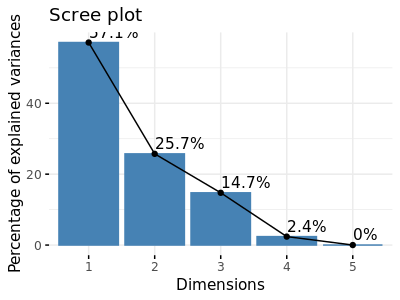

In [55]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 100)

elc_pca <- PCA(elc_pca_meta,quali.sup=c(6:26),graph=F)
fviz_screeplot(elc_pca, addlabels = TRUE)

In [173]:
# build comparism plot variables
c1 <- fviz_pca_ind(X = elc_pca, label = "none", legend.title = "Datasets", title = "", addEllipses = TRUE, axes = c(1, 2), habillage = elc_pca_meta$dataset) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Datasets   ", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis")) +
        scale_shape_manual(name = "Datasets   ", labels = c("Rowtype mutant", "Developmental stages       ", "Drought", "Laxatum mutant   ", "Meiosis", "Photoperiod mutant preanthesis"), 
                      values = c(15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

c2 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Library type", title = "", addEllipses = TRUE, habillage = elc_pca_meta$library) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Library type", labels = c("Paired read", "Single read")) +
        scale_shape_manual(name = "Library type", labels = c("Paired read", "Single read"), 
                      values = c(15, 16)) +
        guides(fill = FALSE)+
        theme_bw()

c3 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "High level age", title = "", addEllipses = FALSE, habillage = elc_pca_meta$high_level_age) +
        scale_colour_npg(palette = c("nrc"), alpha = 1,name = "High-level age") +
        scale_shape_manual(name = "High-level age",  
                      values = c(15, 16, 17, 18, 19)) +
        guides(fill = FALSE)+
        theme_bw()

c4 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "High level tissue", title = "", addEllipses = FALSE, habillage = elc_pca_meta$high_level_tissue) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level tissues") +
        scale_shape_manual(name = "High-level tissues",  
                      values = c(15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE)+
        theme_bw()

cols <- colorRampPalette(brewer.pal(12, "Paired"))
myPal <- cols(length(unique(cnt_log_meta$intermediate_tissue)))

c5 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Intermediate tissue", title = "", addEllipses = FALSE, habillage = elc_pca_meta$intermediate_tissue) +
        scale_colour_manual(values = myPal, name = "Intermediate tissues",
                           limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "spike", "stamen",
                                      "grain"),
                            labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Spike", "Stamen",
                                      "Grain")) + 
        scale_shape_manual(name = "Intermediate tissues",
                           limits = c("seedling", "embryo", "root", 
                                       "epidermis", "leaf", "shoot", "senescence_leaf", "apex",
                                      "anther", "glume", "lemma", "lodicule", "meiocyte", "palea", "rachis", "spike", "stamen",
                                      "grain"),
                            labels = c("Seedling", "Embryo", "Root", 
                                       "Epidermis", "Leaf", "Shoot", "Old leaf", "Apex",
                                      "Anther", "Glume", "Lemma", "Lodicule", "Meiocyte", "Palea", "Rachis", "Spike", "Stamen",
                                      "Grain"),
                      values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()                            

c6 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Intermediate age", title = "", addEllipses = FALSE, habillage = elc_pca_meta$intermediate_age) +
        scale_colour_manual(values = myPal, name = "Intermediate age",
                           limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Heading",
                                       "Anthesis", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Heading",
                                       "Anthesis", "Senescence")) +
        scale_shape_manual(name = "Intermediate age", 
                           limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Heading",
                                       "Anthesis", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Heading",
                                       "Anthesis", "Senescence"),
                      values = c(10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

c7 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Cultivars", title = "", addEllipses = FALSE, habillage = elc_pca_meta$cultivar) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Cultivars") +
        scale_shape_manual(name = "Cultivars", 
                      values = c(14, 15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

#gm
c8 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Genotype", title = "", addEllipses = FALSE, habillage = elc_pca_meta$gm) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Genotype") +
        scale_shape_manual(name = "Genotype",
                      values = c(14, 15)) +
        guides(fill = FALSE) +
        theme_bw()

#growth condition
c9 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Growth condition", title = "", addEllipses = FALSE, habillage = elc_pca_meta$growth_condition) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Growth condition") +
        scale_shape_manual(name = "Growth condition",
                      values = c(14, 15, 16, 17)) +
        guides(fill = FALSE) +
        theme_bw()

Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.


# 3. Library size & log10 counts plots
### 3.1 Quality control: Create long-tables and see log10-transform counts
* here we check how comparable the TPMs are across experiments by making a boxplot of log10-transformed tpm normalized counts
* we have to add a value to avoid log(0), which is 1

In [57]:
# create table of gene_length
length_barley <-data.frame(hord$length)
length_barley <- cbind(geneid = rownames(length_barley), length_barley)
#to remove original rownames:
row.names(length_barley) <- NULL
# for switching between wide and long table formats use "pivotlonger"
long_length_b <- pivot_longer(length_barley, -geneid, names_to = "samples", values_to = "length")
dim(length_barley)
head(length_barley)
head(long_length_b)

[1] 49281   241

,geneid,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Horvu_MOREX_1H01G000100,3689.0025,3651.8054,3635.7592,3665.6306,3684.3519,3665.9270,3654.7407,3671.964,3675.0120,⋯,3528.4293,3538.413,3533.5154,3540.3010,3553.4312,3546.6205,3536.765,3537.0755,3530.3447,3548.3398
2,Horvu_MOREX_1H01G000200,1731.8344,1595.2497,1595.2497,1696.8488,1730.7998,1678.9842,1675.0597,1595.250,1595.2497,⋯,1488.5907,1517.169,1498.8222,1491.3869,1554.6326,1534.8636,1512.966,1595.2497,1510.0324,1533.6788
3,Horvu_MOREX_1H01G000300,1290.0993,1282.9072,1294.2130,1281.7899,1287.0755,1289.7471,1275.7873,1290.714,1286.9053,⋯,1149.2655,1156.752,1146.5112,1144.9956,1174.6506,1160.3280,1157.042,1162.0225,1140.3119,1158.9743
4,Horvu_MOREX_1H01G000400,2046.4959,1993.5407,1959.2683,2008.9173,2050.0688,2002.4680,2003.4146,2019.840,2020.5666,⋯,1784.5880,1815.076,1798.6040,1785.4986,1853.1662,1833.1979,1815.881,1818.7908,1794.9887,1822.8988
5,Horvu_MOREX_1H01G000500,313.4013,303.0055,297.9331,307.9038,310.7067,300.2521,304.2554,305.878,308.3598,⋯,190.1842,194.778,186.2449,183.4847,207.4277,195.4666,188.188,195.4046,182.3936,190.1588
6,Horvu_MOREX_1H01G000600,2100.0926,2116.8430,2136.8307,2108.0259,2093.3599,2123.6432,2105.0441,2114.484,2107.2312,⋯,2057.6173,2053.383,2045.8827,2059.3659,2057.8005,2044.5578,2038.401,2047.0638,2038.1282,2040.1078


geneid,samples,length
<fct>,<chr>,<dbl>
Horvu_MOREX_1H01G000100,ERR781039,3689.003
Horvu_MOREX_1H01G000100,ERR781040,3651.805
Horvu_MOREX_1H01G000100,ERR781041,3635.759
Horvu_MOREX_1H01G000100,ERR781042,3665.631
Horvu_MOREX_1H01G000100,ERR781043,3684.352
Horvu_MOREX_1H01G000100,ERR781044,3665.927


In [58]:
#convert filtered count matrix into dataframe
cnt_barley_df <- data.frame(geneid = rownames(bcp_filtered), bcp_filtered, stringsAsFactors = TRUE)
#cnt <- cbind(GeneID = rownames(cnt), cnt)
#to remove original rownames:
row.names(cnt_barley_df) <- NULL
dim(cnt_barley_df)
head(cnt_barley_df)
long_cnt_b <- pivot_longer(cnt_barley_df, -geneid, names_to = "samples", values_to = "count")
head(long_cnt_b)

[1] 42775   241

,geneid,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Horvu_MOREX_1H01G000100,336.0000,122.0000,66.0000,208.0000,354.000,452.0000,388.0000,405.0000,359.0000,⋯,1232.000,2237.000,1503.000,1833.000,1695.000,2477.000,2265.000,2578.000,2468.000,2317.000
2,Horvu_MOREX_1H01G000200,1.0000,0.0000,0.0000,1.0000,1.000,1.0000,1.0000,0.0000,0.0000,⋯,1.000,3.000,10.000,1.000,2.000,8.000,6.000,0.000,2.000,2.000
3,Horvu_MOREX_1H01G000300,116.0000,56.0000,45.0000,98.0000,108.000,163.0000,160.0000,133.0000,117.0000,⋯,428.000,610.000,519.000,466.000,492.000,652.000,569.000,677.000,710.000,584.000
4,Horvu_MOREX_1H01G000400,550.0000,184.0000,133.0000,351.0000,549.000,657.0000,577.0000,605.0000,540.0000,⋯,971.000,1640.000,1312.000,1160.000,2093.000,2738.000,2795.000,3687.000,3044.000,3045.000
5,Horvu_MOREX_1H01G000500,556.0000,167.0000,116.0000,382.0000,511.000,635.0000,772.0000,607.0000,630.0000,⋯,3656.000,4336.000,4734.000,4469.000,2296.000,2418.000,2349.000,3908.000,3340.000,3221.000
6,Horvu_MOREX_1H01G000600,707.3084,260.5543,146.4439,381.1077,572.695,776.8168,827.0809,874.5452,566.1862,⋯,2808.661,3316.393,2766.549,2833.275,2984.255,4250.868,3915.629,4172.974,4106.843,4045.146


geneid,samples,count
<fct>,<chr>,<dbl>
Horvu_MOREX_1H01G000100,ERR781039,336
Horvu_MOREX_1H01G000100,ERR781040,122
Horvu_MOREX_1H01G000100,ERR781041,66
Horvu_MOREX_1H01G000100,ERR781042,208
Horvu_MOREX_1H01G000100,ERR781043,354
Horvu_MOREX_1H01G000100,ERR781044,452


In [59]:
logtransform <- semi_join(long_cnt_b, long_length_b, by = "geneid")
dim(logtransform)

Warning message:
“Column `geneid` joining factors with different levels, coercing to character vector”

[1] 10266000        3

In [60]:
logtransform <- logtransform %>% dplyr::mutate(minTPM = min(count[count>0]), log10TPM = log10(count+1))
head(logtransform)

geneid,samples,count,minTPM,log10TPM
<fct>,<chr>,<dbl>,<dbl>,<dbl>
Horvu_MOREX_1H01G000100,ERR781039,336,9.650079e-09,2.527630
Horvu_MOREX_1H01G000100,ERR781040,122,9.650079e-09,2.089905
Horvu_MOREX_1H01G000100,ERR781041,66,9.650079e-09,1.826075
Horvu_MOREX_1H01G000100,ERR781042,208,9.650079e-09,2.320146
Horvu_MOREX_1H01G000100,ERR781043,354,9.650079e-09,2.550228
Horvu_MOREX_1H01G000100,ERR781044,452,9.650079e-09,2.656098


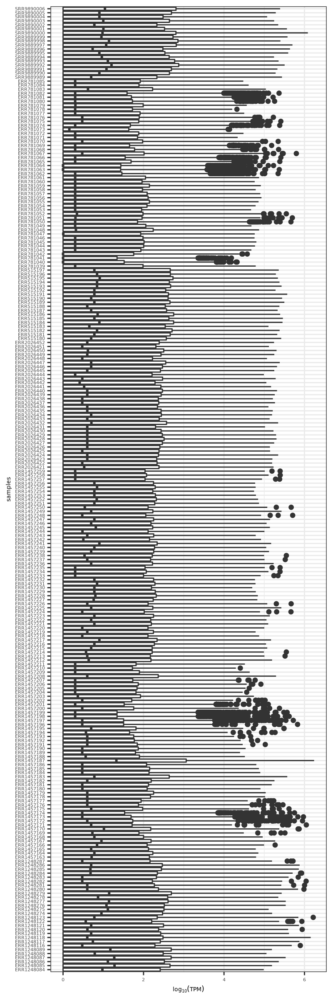

In [61]:
options(repr.plot.width = 4, repr.plot.height = 12, repr.plot.res = 200)
ggplot(logtransform, aes(x=samples, y=log10TPM)) + geom_boxplot() + coord_flip() + ylab(expression(log[10](TPM))) + theme(text = element_text(size = 5))

## 3.2 Plot library size differences

Warning message:
“funs() is soft deprecated as of dplyr 0.8.0
Please use a list of either functions or lambdas: 

  # Simple named list: 
  list(mean = mean, median = median)

  # Auto named with `tibble::lst()`: 
  tibble::lst(mean, median)

  # Using lambdas
  list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))
This warning is displayed once per session.”Warning message:
“Column `ID` joining factor and character vector, coercing into character vector”

,ID,dataset,instrument,library,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,n
,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>
1,ERR781039,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Germination,Seedling,apex,meristem,44898393
2,ERR781040,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Germination,Seedling,apex,meristem,44588570
3,ERR781041,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Germination,Seedling,apex,meristem,44524255
4,ERR781042,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Leaf_development,Vegetative,apex,meristem,44629928
5,ERR781043,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Leaf_development,Vegetative,apex,meristem,44858498
6,ERR781044,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Leaf_development,Vegetative,apex,meristem,44881329


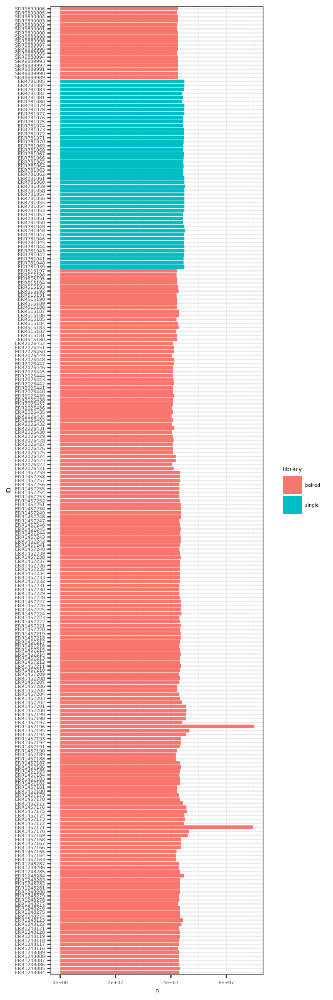

In [62]:
options(repr.plot.width = 4, repr.plot.height = 12, repr.plot.res = 200)
lib <- as.data.frame(length_barley, stringsAsFactors = FALSE)
libsize <- lib %>% select(-geneid) %>% mutate_each(funs(sum)) %>% slice(1) %>% gather("ID", "n", 1:240)
#libsize$n <- log2(libsize$n)
libsize <- inner_join(barley_mix_meta, libsize, by = "ID")
head(libsize)
libsize %>% ggplot(aes(x = ID, y = n, fill =library)) + geom_col() + coord_flip() + theme(text = element_text(size = 5))

# 4. Normalization with `DeSeq2`
## 4.1 Variance Stabilization on raw TPM counts
* based on all the exploratory analysis 2(+1) main technical variables are majorly responsible for the clustering of the counts: `dataset`, `library` and `instrument`
* these 3 variables has to go to the design matrix: as their numbering and division borders are the same, `dataset` alone covers for all of them, and including all would cause linearity in the model
* Deseq2 can only take raw counts as input and filtering can be performed before DEG analysis after creating the design
* an example: https://support.bioconductor.org/p/65256/

In [63]:
# important to check whether the order of count matrix columns are the same as the rownames of metadata
all(rownames(barley_meta) == colnames(hord))

[1] TRUE

#### 2.5.1 Create the design matrix
* to cite DeSeq2: https://workshop.eupathdb.org/bop/pdfs/beginner_DeSeq2.pdf
    The simplest design formula for differential expression would be ∼ condition, where condition is a column in colData(dds) which specifies which of two (or more groups) the samples belong to. For the parathyroid experiment, we will specify ∼ patient + treatment, which means that we want to test for the effect of treatment (the last factor), controlling for the effect of patient (the first factor). You can use R’s formula notation to express any experimental design that can be described within an ANOVA-like framework. Note that DESeq2 uses the same kind of formula as in base R, e.g., for use by the lm function. If the question of interest is whether a fold change due to treatment is different across groups, for example across patients, “interaction terms” can be included using models such as ∼ patient + treatment + patient:treatment. More complex designs such as these are covered in the other DESeq2 vignette.
* source: https://bioconductor.org/packages/release/bioc/vignettes/limma/inst/doc/usersguide.pdf

* **The approach requires one or two matrices to be specified:** The first is the **design matrix** which indicates in effect which RNA samples have been applied to each array. The second is the **contrast matrix** which specifies which comparisons you would like to make between the RNA samples.

* **The philosophy of the approach is as follows:** You have to start by fitting a linear model to your data which fully models the systematic part of your data. The model is specified by the design matrix. Each row of the design matrix corresponds to an array in your experiment and each column corresponds to a coefficient that is used to describe the RNA sources in your experiment. With single-channel data (like RNAseq), you will need as many coefficients as you have distinct RNA sources, no more and no less. Any set of independent coefficients will do, providing they describe all your treatments. The main purpose of this step is to estimate the variability in the data, hence the systematic part needs to be modelled so it can be distinguished from random variation.

* the design should reflect the aim of the differential expression, such as here we want to see whether different tissue types and developmental stages cause a difference in gene expression

* at the same time the design should account for technical variabilites only, should NOT include any biological variation that we are aiming to see

(by including biological variables the normalisation will occur on those differences that we wanted to explore!!)

In [64]:
# dataset in intercept
dds_barley <- DESeqDataSetFromTximport(hord,
                                   colData = barley_meta,
                                   design = ~ dataset)
head(counts(dds_barley))

  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not an warning or error]
using counts and average transcript lengths from tximport


,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,ERR781048,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
Horvu_MOREX_1H01G000100,336,122,66,208,354,452,388,405,359,657,⋯,1232,2237,1503,1833,1695,2477,2265,2578,2468,2317
Horvu_MOREX_1H01G000200,1,0,0,1,1,1,1,0,0,1,⋯,1,3,10,1,2,8,6,0,2,2
Horvu_MOREX_1H01G000300,116,56,45,98,108,163,160,133,117,284,⋯,428,610,519,466,492,652,569,677,710,584
Horvu_MOREX_1H01G000400,550,184,133,351,549,657,577,605,540,1183,⋯,971,1640,1312,1160,2093,2738,2795,3687,3044,3045
Horvu_MOREX_1H01G000500,556,167,116,382,511,635,772,607,630,1166,⋯,3656,4336,4734,4469,2296,2418,2349,3908,3340,3221
Horvu_MOREX_1H01G000600,707,261,146,381,573,777,827,875,566,1398,⋯,2809,3316,2767,2833,2984,4251,3916,4173,4107,4045


In [65]:
dds_barley <- estimateSizeFactors(dds_barley)
summary(sizeFactors(dds_barley))

  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not an warning or error]
using 'avgTxLength' from assays(dds), correcting for library size


Length  Class   Mode 
     0   NULL   NULL 

#### 2.5.2 Filter lowly expressed genes for faster computing

In [66]:
# filter out genes that have no reads in any of the experiments
keep <- rowSums(counts(dds_barley)) > 0
dds_barley <- dds_barley[keep,]
# filter out genes where there are less than 2 samples with normalized counts greater than or equal to 0.5
keep <- rowSums(counts(dds_barley) >= 0.5) >= 2
dds_barley <- dds_barley[keep,]
head(dds_barley)
dim(counts(dds_barley))
head(counts(dds_barley))

class: DESeqDataSet 
dim: 6 240 
metadata(1): version
assays(3): counts avgTxLength normalizationFactors
rownames(6): Horvu_MOREX_1H01G000100 Horvu_MOREX_1H01G000200 ...
  Horvu_MOREX_1H01G000500 Horvu_MOREX_1H01G000600
rowData names(0):
colnames(240): ERR781039 ERR781040 ... ERR515196 ERR515197
colData names(22): ID dataset ... instrument library

[1] 42706   240

,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,ERR781048,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
Horvu_MOREX_1H01G000100,336,122,66,208,354,452,388,405,359,657,⋯,1232,2237,1503,1833,1695,2477,2265,2578,2468,2317
Horvu_MOREX_1H01G000200,1,0,0,1,1,1,1,0,0,1,⋯,1,3,10,1,2,8,6,0,2,2
Horvu_MOREX_1H01G000300,116,56,45,98,108,163,160,133,117,284,⋯,428,610,519,466,492,652,569,677,710,584
Horvu_MOREX_1H01G000400,550,184,133,351,549,657,577,605,540,1183,⋯,971,1640,1312,1160,2093,2738,2795,3687,3044,3045
Horvu_MOREX_1H01G000500,556,167,116,382,511,635,772,607,630,1166,⋯,3656,4336,4734,4469,2296,2418,2349,3908,3340,3221
Horvu_MOREX_1H01G000600,707,261,146,381,573,777,827,875,566,1398,⋯,2809,3316,2767,2833,2984,4251,3916,4173,4107,4045


In [67]:
dds_barley <- estimateDispersions(dds_barley)

gene-wise dispersion estimates
mean-dispersion relationship
  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not an warning or error]
final dispersion estimates
  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not an warning or error]


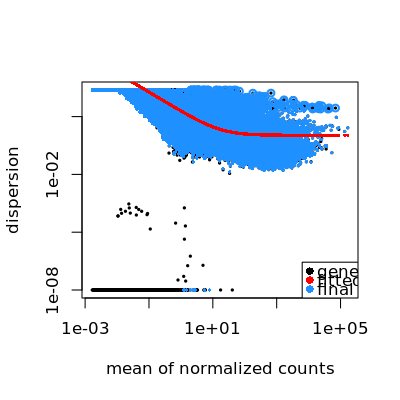

In [68]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 100)
plotDispEsts(dds_barley)

In [69]:
setwd("/nfs/pgsb/projects/comparative_triticeae/phenotype/flower_development/refsets/hordeum/")
saveRDS(dds_barley, file="dds_barley.rds")

In [70]:
# this function gives log2 to raw counts
vsd_barley <- varianceStabilizingTransformation(dds_barley)
# this function returns matrix with log2transformed counts
vsdMat_barley <- assay(vsd_barley)
# solution here: https://www.biostars.org/p/308647/ - drastic filtering is recommended: 
#"You should definitely remove genes that only have zeros (i.e. 100% zeros), 
# and then remove other genes that have a high proportion of zeros (i.e. >50% zeros).
# You can also do the logic another way by removing all genes whose mean raw count across all samples is <-10."

In [71]:
# according to previous warning message here I filter out genes that are missing in 220 samples or more and missing = TPM <1
idx <- rowSums( counts(dds_barley) >= 0.5 ) >= 220
dds_barley_filt <- dds_barley[idx,]
dim(counts(dds_barley_filt))
head(dds_barley_filt)

[1] 16933   240

class: DESeqDataSet 
dim: 6 240 
metadata(1): version
assays(4): counts avgTxLength normalizationFactors mu
rownames(6): Horvu_MOREX_1H01G000100 Horvu_MOREX_1H01G000300 ...
  Horvu_MOREX_1H01G000600 Horvu_MOREX_1H01G000700
rowData names(10): baseMean baseVar ... dispOutlier dispMAP
colnames(240): ERR781039 ERR781040 ... ERR515196 ERR515197
colData names(22): ID dataset ... instrument library

found already estimated dispersions, replacing these
gene-wise dispersion estimates
mean-dispersion relationship
-- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.
  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not an warning or error]
final dispersion estimates
  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not an warning or error]


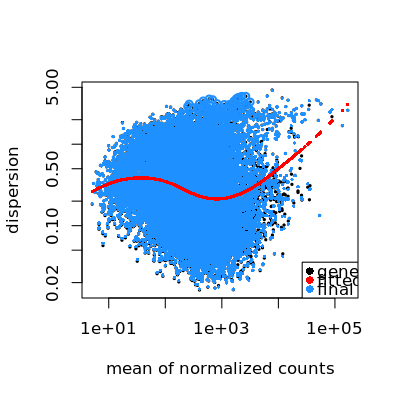

In [72]:
dds_barley_filt <- estimateDispersions(dds_barley_filt)
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 100)
plotDispEsts(dds_barley_filt)

In [73]:
vsd_barley_filt <- varianceStabilizingTransformation(dds_barley_filt)
# this function returns matrix with log2transformed counts
vsdMat_barley_filt <- assay(vsd_barley_filt)

## 0 at intercept

In [74]:
# 0 intercept
dds_barley_zero <- DESeqDataSetFromTximport(hord,
                                   colData = barley_meta,
                                   design = ~ 0)
head(counts(dds_barley))

using counts and average transcript lengths from tximport


,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,ERR781048,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
Horvu_MOREX_1H01G000100,336,122,66,208,354,452,388,405,359,657,⋯,1232,2237,1503,1833,1695,2477,2265,2578,2468,2317
Horvu_MOREX_1H01G000200,1,0,0,1,1,1,1,0,0,1,⋯,1,3,10,1,2,8,6,0,2,2
Horvu_MOREX_1H01G000300,116,56,45,98,108,163,160,133,117,284,⋯,428,610,519,466,492,652,569,677,710,584
Horvu_MOREX_1H01G000400,550,184,133,351,549,657,577,605,540,1183,⋯,971,1640,1312,1160,2093,2738,2795,3687,3044,3045
Horvu_MOREX_1H01G000500,556,167,116,382,511,635,772,607,630,1166,⋯,3656,4336,4734,4469,2296,2418,2349,3908,3340,3221
Horvu_MOREX_1H01G000600,707,261,146,381,573,777,827,875,566,1398,⋯,2809,3316,2767,2833,2984,4251,3916,4173,4107,4045


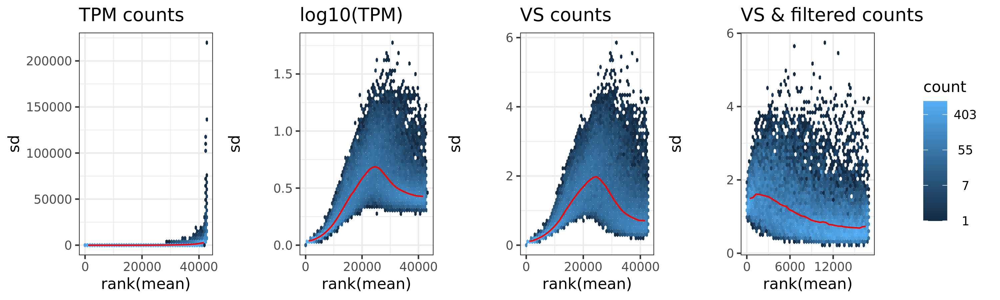

In [75]:
# figure about why variance stabilization is necessary
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
options(repr.plot.width = 10, repr.plot.height = 3, repr.plot.res = 300)

p1 <- meanSdPlot(as.matrix(cnt_barley_df[,-1]),plot=F)

logtpm_wide <- logtransform %>% dplyr::select(geneid, samples, log10TPM) %>% spread(samples, log10TPM)
p2 <- meanSdPlot(as.matrix(logtpm_wide[,-1]), plot=F)

p3 <- meanSdPlot(vsdMat_barley, plot = F)

p4 <- meanSdPlot(vsdMat_barley_filt, plot = F)

prow <- plot_grid(p1$gg + ggtitle("TPM counts") + theme(legend.position="none") + scale_x_continuous(breaks =c(0, 20000, 40000)), 
                  p2$gg + ggtitle("log10(TPM)") + theme(legend.position="none") + scale_x_continuous(breaks =c(0, 20000, 40000)), 
                  p3$gg + ggtitle("VS counts") + theme(legend.position="none") + scale_x_continuous(breaks =c(0, 20000, 40000)), 
                  p4$gg + ggtitle("VS & filtered counts") + theme(legend.position="none") + scale_x_continuous(breaks =c(0, 6000, 12000)), align = 'vh', hjust = -1, nrow = 1)

legend <- get_legend(p1$gg + theme(legend.box.margin = margin(0, 0, 0, 12)))

plot_grid(prow, legend, rel_widths = c(3, .4))

#cowplot::plot_grid(p1$gg + ggtitle("TPM") + scale_x_continuous(breaks =c(0, 25000, 75000, 125000)), p2$gg + ggtitle("log10(TPM)"), p3$gg + ggtitle("Variance Stabilized counts"), ncol = 3)
# to save as a png
#png("stabilized_counts.png", units="in", width=10, height=4, res=300)
#cowplot::plot_grid(p1$gg + ggtitle("TPM") + scale_x_continuous(breaks =c(0, 25000, 75000, 125000)), p2$gg + ggtitle("log10(TPM)"), p3$gg + ggtitle("Variance Stabilized counts"), ncol = 3)
#dev.off()

# 5. Confirming normalization efficiency with PCAs on vsdMat & log2-transformed counts

In [76]:
dim(vsdMat_barley) # this is a matrix with log2 transformed & variance stabilized tpm counts
head(vsdMat_barley)

[1] 42706   240

,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,ERR781048,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
Horvu_MOREX_1H01G000100,8.971205,9.0915053,8.8603373,9.088455,9.251617,9.273224,9.107799,9.1918150,9.2295198,9.073098,⋯,8.814588,9.334160,8.897559,9.111361,9.416545,9.498462,9.491989,9.4454356,9.468640,9.420817
Horvu_MOREX_1H01G000200,2.032568,0.7690516,0.7690516,2.417079,2.119921,1.996646,2.018025,0.7690516,0.7690516,1.718469,⋯,1.443195,1.787491,2.635639,1.383437,1.743979,2.384026,2.248940,0.7690516,1.605307,1.613222
Horvu_MOREX_1H01G000300,7.392429,7.9090290,8.2240799,7.949748,7.495719,7.744141,7.781908,7.5321793,7.5639975,7.809411,⋯,7.347209,7.512144,7.425992,7.208823,7.666285,7.623178,7.550687,7.5616247,7.737956,7.487454
Horvu_MOREX_1H01G000400,9.633976,9.6600084,9.8631971,9.812757,9.833075,9.788147,9.650166,9.7358363,9.7842084,9.872906,⋯,8.562007,8.956992,8.781917,8.548428,9.763854,9.699532,9.860888,10.0242175,9.850826,9.879299
Horvu_MOREX_1H01G000500,9.209902,9.0920873,9.2371056,9.493164,9.305107,9.329708,9.640423,9.3168378,9.5706457,9.402129,⋯,10.546183,10.424536,10.747563,10.617897,9.907260,9.601091,9.732085,10.1772478,10.133684,10.071750
Horvu_MOREX_1H01G000600,10.040565,10.1591207,9.9553844,9.944255,9.947375,10.027684,10.179341,10.2834250,9.8742546,10.164439,⋯,9.964155,9.873234,9.750279,9.706618,10.206053,10.258014,10.262496,10.1151201,10.181710,10.208648


In [77]:
# switching rows to columns
vs <- t(vsdMat_barley)
vs <- as.data.frame(vs, stringsAsFactors = TRUE)
# adding rownames=ID as a column
vs <- cbind(ID = rownames(vs), vs)
rownames(vs) <- vs$ID
dim(vs)
# include metadata table
vs_meta <- inner_join(barley_mix_meta, vs, by = "ID")
# add rownames again
rownames(vs_meta) <- vs_meta$ID
# convert variables which are not factor into factor that they could be part of pca
# this part depends on the used metadata-variables
#vs_meta$rna_input<-factor(vs_meta$rna_input)
#vs_meta$batch<-factor(vs_meta$batch)
#class(vs_meta$rna_input)
#class(vs_meta$batch)
# change factor levels where extra levels are present from single dataset: inf_dev & tf_q for dataset, 21 for temp
vs_meta <- droplevels(vs_meta)
# delete ID column to not have it as extra supplementary variable
vs_meta <- select(vs_meta, -ID)
# create classes to check on class types -> pca can handle supplementary variables only as factors!
classes <- sapply(X = vs_meta, FUN = class)
table(classes)
which(classes == 'factor')
dim(vs_meta)
head(vs_meta)

[1]   240 42707

classes
 factor numeric 
      7   42706 

dataset          instrument             library    intermediate_age 
                  1                   2                   3                   4 
     high_level_age intermediate_tissue   high_level_tissue 
                  5                   6                   7

[1]   240 42713

,dataset,instrument,library,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,Horvu_MOREX_1H01G000100,Horvu_MOREX_1H01G000200,Horvu_MOREX_1H01G000300,⋯,Horvu_MOREX_Un01G109600,Horvu_MOREX_Un01G109700,Horvu_MOREX_Un01G109800,Horvu_MOREX_Un01G109900,Horvu_MOREX_Un01G110000,Horvu_MOREX_Un01G110100,Horvu_MOREX_Un01G110300,Horvu_MOREX_Un01G110400,Horvu_MOREX_Un01G110500,Horvu_MOREX_Un01G110600
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR781039,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Germination,Seedling,apex,meristem,8.971205,2.0325681,7.392429,⋯,0.7690516,0.7690516,2.6279634,0.7690516,3.2669183,2.1471080,1.8973878,0.7690516,0.7690516,0.7690516
ERR781040,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Germination,Seedling,apex,meristem,9.091505,0.7690516,7.909029,⋯,0.7690516,0.7690516,4.5471741,0.7690516,0.7690516,0.7690516,0.7690516,0.7690516,3.3911169,0.7690516
ERR781041,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Germination,Seedling,apex,meristem,8.860337,0.7690516,8.224080,⋯,0.7690516,0.7690516,0.7690516,0.7690516,0.7690516,2.7822711,0.7690516,0.7690516,0.7690516,0.7690516
ERR781042,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Leaf_development,Vegetative,apex,meristem,9.088455,2.4170793,7.949748,⋯,0.7690516,2.3610908,0.7690516,2.6427499,3.5455882,0.7690516,0.7690516,0.7690516,2.3034971,0.7690516
ERR781043,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Leaf_development,Vegetative,apex,meristem,9.251617,2.1199213,7.495719,⋯,0.7690516,0.7690516,2.7508079,2.5887584,2.7515742,0.7690516,0.7690516,0.7690516,2.0326540,0.7690516
ERR781044,photoperiod_mutant_preanthesis,Illumina HiSeq 2000,single,Leaf_development,Vegetative,apex,meristem,9.273224,1.9966460,7.744141,⋯,0.7690516,0.7690516,2.5687895,0.7690516,0.7690516,0.7690516,0.7690516,0.7690516,1.9056168,0.7690516


In [78]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 100)
vs_pca <- PCA(X = vs_meta, scale.unit = FALSE, ncp = 4, quali.sup = c(1:7), graph = F)
#summary(vs_PCA)

,eigenvalue,percentage of variance,cumulative percentage of variance
comp 1,27011.744,32.496635,32.49663
comp 2,11717.474,14.096775,46.59341
comp 3,5993.409,7.210406,53.80382
comp 4,4491.110,5.403056,59.20687
comp 5,3946.441,4.747789,63.95466
comp 6,3582.051,4.309407,68.26407


Warning message in brewer.pal(18, "Paired"):
“n too large, allowed maximum for palette Paired is 12
Returning the palette you asked for with that many colors
”

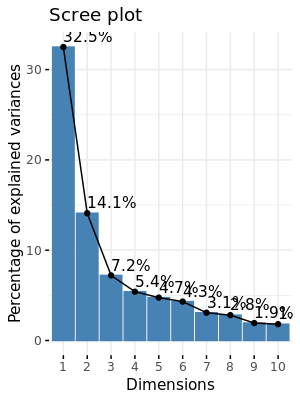

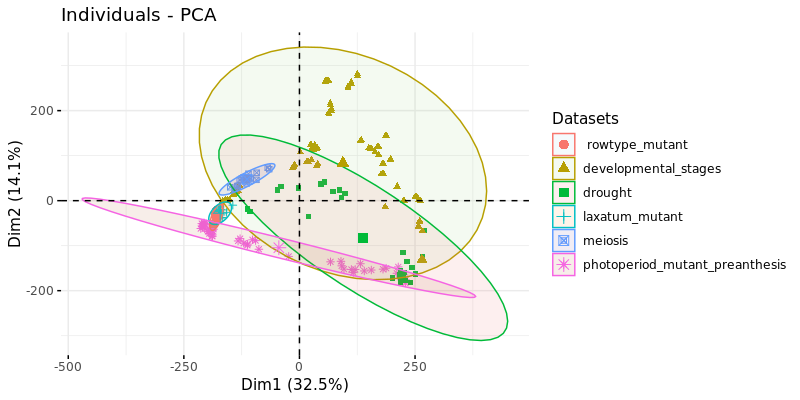

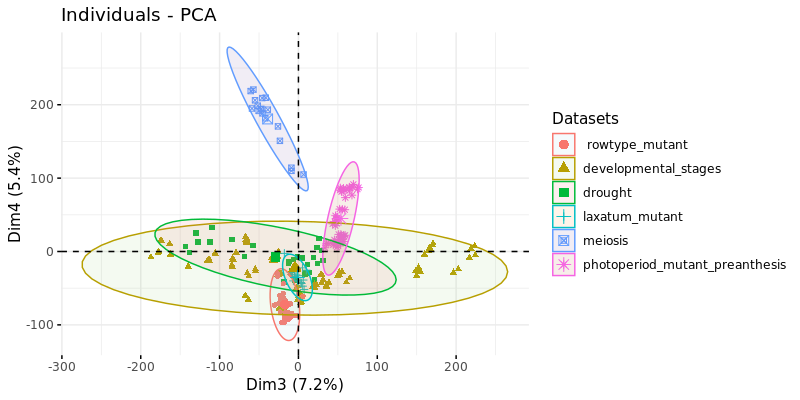

In [79]:
options(repr.plot.width = 3, repr.plot.height = 4, repr.plot.res = 100)
# display eigenvalues
head(vs_pca$eig)
# display scree plot
fviz_eig(vs_pca, addlabels = TRUE)
# display individuals (samples) colored by technical variable
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 100)
colourCount = length(unique(vs_meta$dataset))
getPalette = colorRampPalette(brewer.pal(18, "Paired"))
fviz_pca_ind(X = vs_pca, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = vs_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))
fviz_pca_ind(X = vs_pca, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(3, 4), habillage = vs_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))

# 7. Pearson's correlation matrix
* -1 indicates a perfectly negative linear correlation between two variables
* 0 indicates no linear correlation between two variables
* 1 indicates a perfectly positive linear correlation between two variables

In [186]:
barley_cor <- cor(bcp_filtered, method = c("pearson"))
head(barley_cor)
min(barley_cor)
max(barley_cor)
mean(barley_cor-(barley_cor == 1))
median(barley_cor-(barley_cor == 1))

,ERR781039,ERR781040,ERR781041,ERR781042,ERR781043,ERR781044,ERR781045,ERR781046,ERR781047,ERR781048,⋯,ERR515188,ERR515189,ERR515190,ERR515191,ERR515192,ERR515193,ERR515194,ERR515195,ERR515196,ERR515197
ERR781039,1.0000000,0.9983506,0.9804698,0.9739204,0.9877802,0.9847281,0.9878523,0.9890610,0.9882486,0.9630949,⋯,0.9139018,0.9137167,0.9192863,0.8328885,0.9244350,0.9289617,0.9324661,0.9258872,0.9268537,0.9211383
ERR781040,0.9983506,1.0000000,0.9846675,0.9763716,0.9888377,0.9861224,0.9905447,0.9911266,0.9907827,0.9653344,⋯,0.9106083,0.9089604,0.9163639,0.8262359,0.9267953,0.9310937,0.9336084,0.9281015,0.9268211,0.9243519
ERR781041,0.9804698,0.9846675,1.0000000,0.9732351,0.9737301,0.9701909,0.9803507,0.9819359,0.9849803,0.9568307,⋯,0.8964810,0.8921265,0.9067657,0.8232435,0.9247116,0.9262382,0.9297147,0.9290851,0.9223419,0.9222295
ERR781042,0.9739204,0.9763716,0.9732351,1.0000000,0.9880459,0.9785536,0.9851420,0.9834619,0.9877229,0.9669904,⋯,0.8950100,0.8915620,0.9067965,0.8554948,0.9251243,0.9276731,0.9275293,0.9301284,0.9297665,0.9235358
ERR781043,0.9877802,0.9888377,0.9737301,0.9880459,1.0000000,0.9935679,0.9949366,0.9941801,0.9932371,0.9808674,⋯,0.9025797,0.8992748,0.9094608,0.8300518,0.9328699,0.9371689,0.9373477,0.9374064,0.9368356,0.9314445
ERR781044,0.9847281,0.9861224,0.9701909,0.9785536,0.9935679,1.0000000,0.9917372,0.9940058,0.9878144,0.9765495,⋯,0.8954324,0.8934389,0.9022871,0.8224461,0.9310485,0.9348337,0.9342368,0.9334593,0.9386467,0.9279439


[1] 0.005440028

[1] 1

[1] 0.4447591

[1] 0.4001333

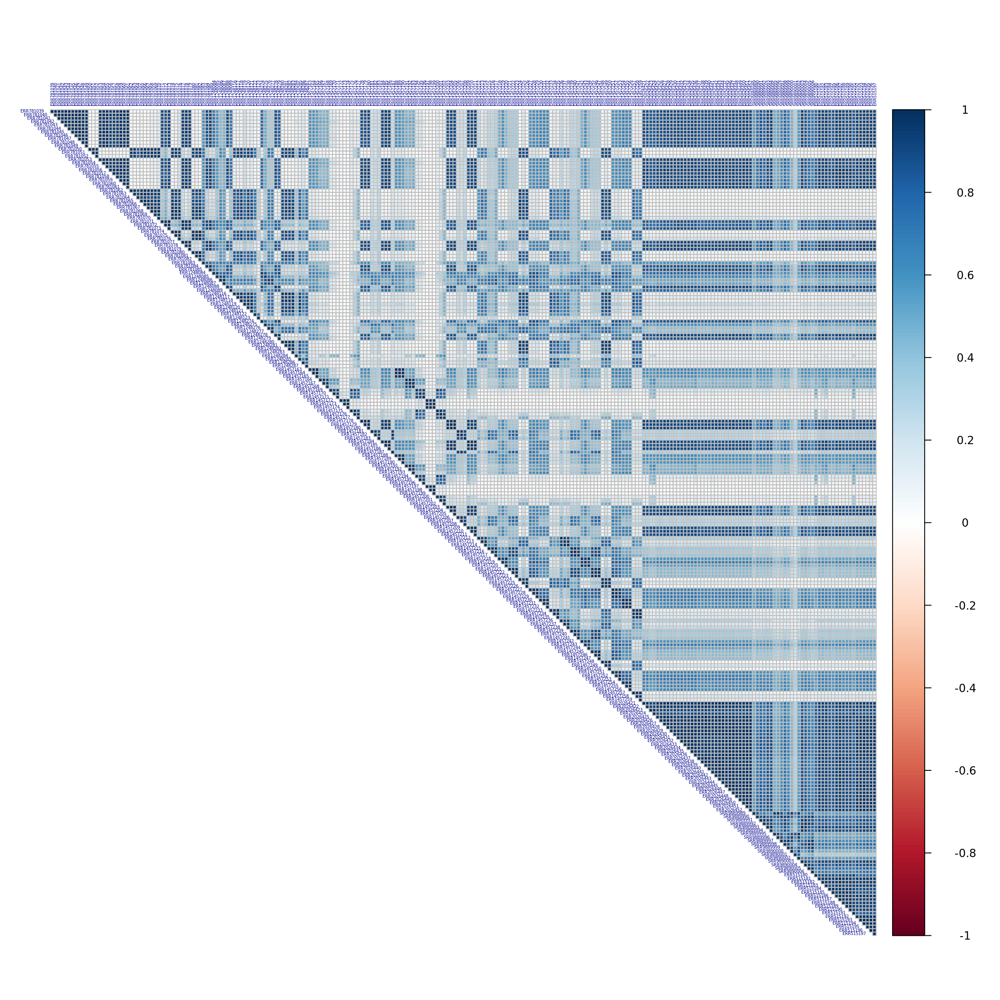

In [187]:
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 200)
corrplot(barley_cor, tl.cex = 0.3, tl.col = "darkblue", type = "upper")
         #sig.level = 0.05, tl.srt = 75)

# 8. Summarizing comparism figures

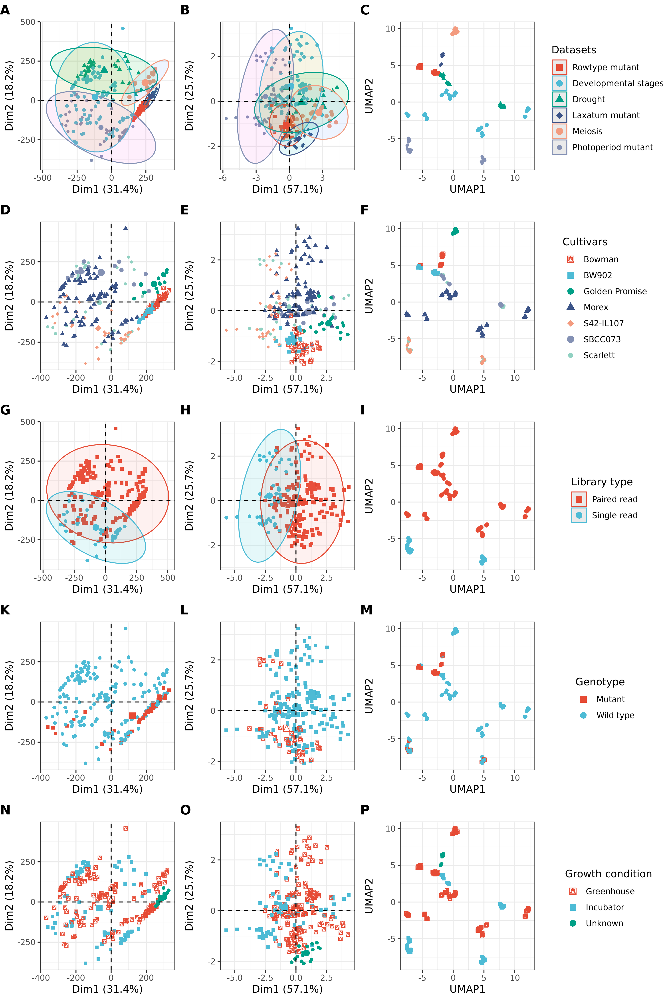

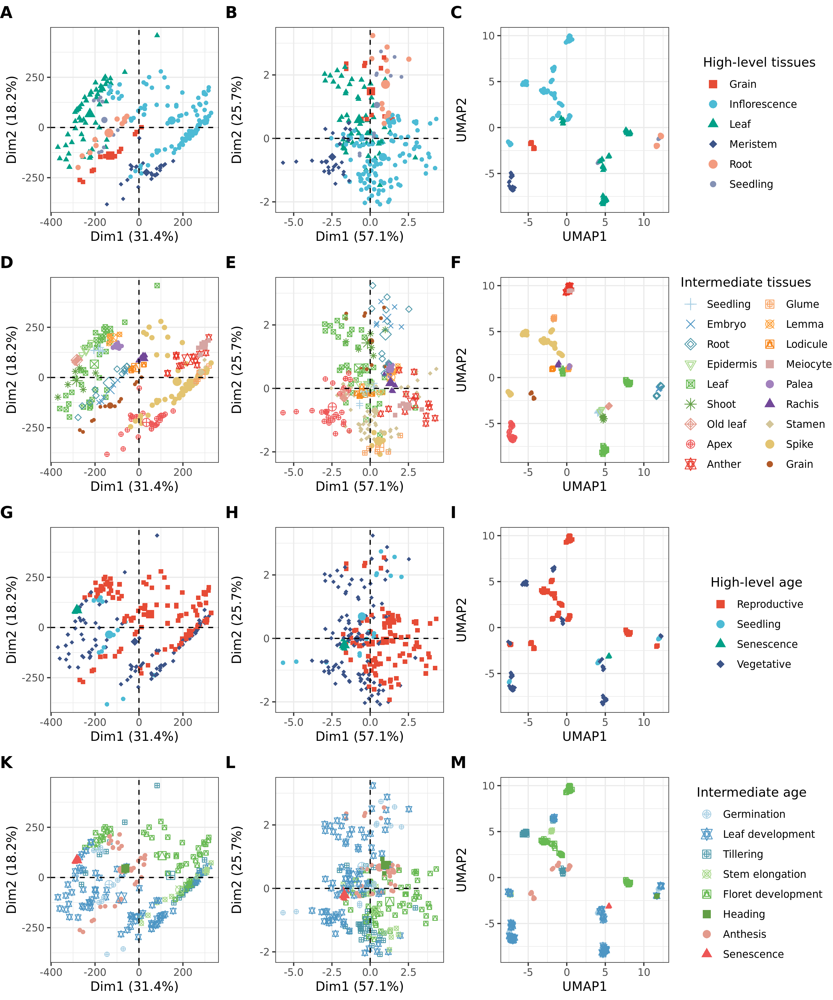

In [229]:
# giant exploratory analysis comparism figures
# here UMAP is on log2&filtered-counts!!!
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")

prow1 <- plot_grid(a1 + theme(legend.position="none"),
                   c1 + theme(legend.position="none"),
                   b1 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend1 <- get_legend(a1 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t1 <- plot_grid(prow1, legend1, nrow = 1, rel_widths = c(3, .7))

prow2 <- plot_grid(a2 + theme(legend.position="none"),
                   c2 + theme(legend.position="none"),
                   b2 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend2 <- get_legend(a2 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t2 <- plot_grid(prow2, legend2, nrow = 1, rel_widths = c(3, .7))

prow3 <- plot_grid(a3 + theme(legend.position="none"),
                   c3 + theme(legend.position="none"),
                   b3 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend3 <- get_legend(a3 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t3 <- plot_grid(prow3, legend3, nrow = 1, rel_widths = c(3, .7))

prow4 <- plot_grid(a4 + theme(legend.position="none"),
                   c4 + theme(legend.position="none"),
                   b4 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend4 <- get_legend(a4 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t4 <- plot_grid(prow4, legend4, nrow = 1, rel_widths = c(3, .7))

prow5 <- plot_grid(a5 + theme(legend.position="none"),
                   c5 + theme(legend.position="none"),
                   b5 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend5 <- get_legend(a5 + guides(color = guide_legend(ncol = 2)) + theme(legend.position = "right"))
t5 <- plot_grid(prow5, legend5, nrow = 1, rel_widths = c(3, .7))

prow6 <- plot_grid(a6 + theme(legend.position="none"),
                   c6 + theme(legend.position="none"),
                   b6 + theme(legend.position="none"),
                   labels = c( "K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend6 <- get_legend(a6 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t6 <- plot_grid(prow6, legend6, nrow = 1, rel_widths = c(3, .7))


prow7 <- plot_grid(a7 + theme(legend.position="none"),
                   c7 + theme(legend.position="none"),
                   b7 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend7 <- get_legend(a7 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t7 <- plot_grid(prow7, legend7, nrow = 1, rel_widths = c(3, .7))

prow8 <- plot_grid(a8 + theme(legend.position="none"),
                   c8 + theme(legend.position="none"),
                   b8 + theme(legend.position="none"),
                   labels = c("K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend8 <- get_legend(a8 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t8 <- plot_grid(prow8, legend8, nrow = 1, rel_widths = c(3, .7))

prow9 <- plot_grid(a9 + theme(legend.position="none"),
                   c9 + theme(legend.position="none"),
                   b9 + theme(legend.position="none"),
                   labels = c( "N", "O", "P"),
                   align = 'vh', hjust = 0, nrow = 1)
legend9 <- get_legend(a9 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t9 <- plot_grid(prow9, legend9, nrow = 1, rel_widths = c(3, .7))

# figures:
# - 1(dataset),7(cultivar),2(library),8(gm),9(growth)
# - 4(high_tissue),5(intermed_tissue),3(high_age),6(intermed_age)

options(repr.plot.width = 10, repr.plot.height = 15, repr.plot.res = 300)
fig1 <- plot_grid(t1, t7, t2, t8, t9, nrow = 5)
fig1

options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 300)
fig2 <- plot_grid(t4, t5, t3, t6, nrow = 4)
fig2

ggsave("pca_umap1_barley.pdf", plot = fig1, width = 10, height = 15)
ggsave("pca_umap2_barley.pdf", plot = fig2, width = 10, height = 12)

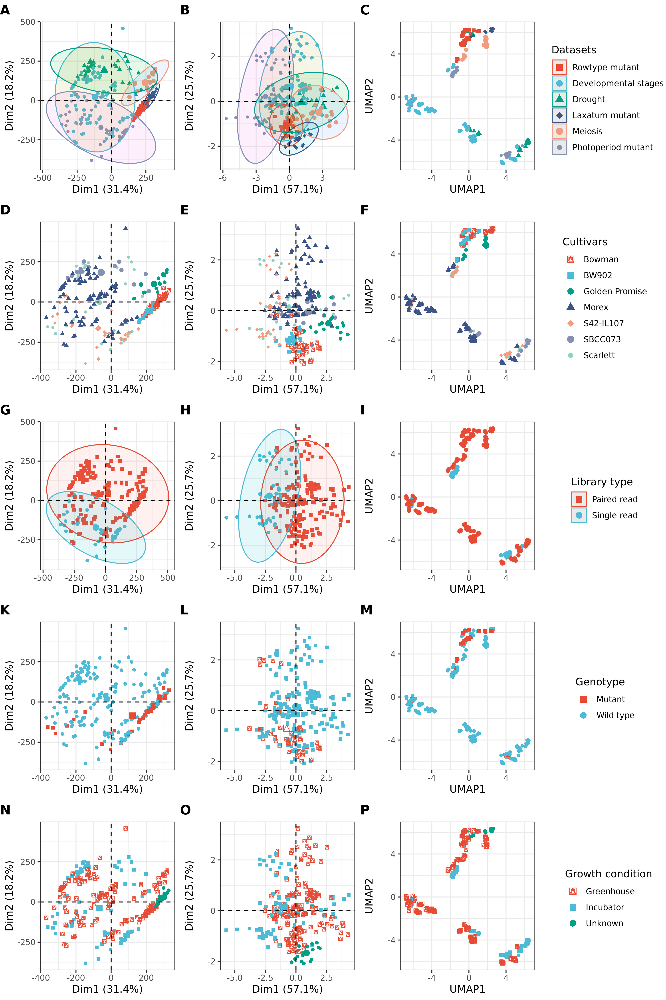

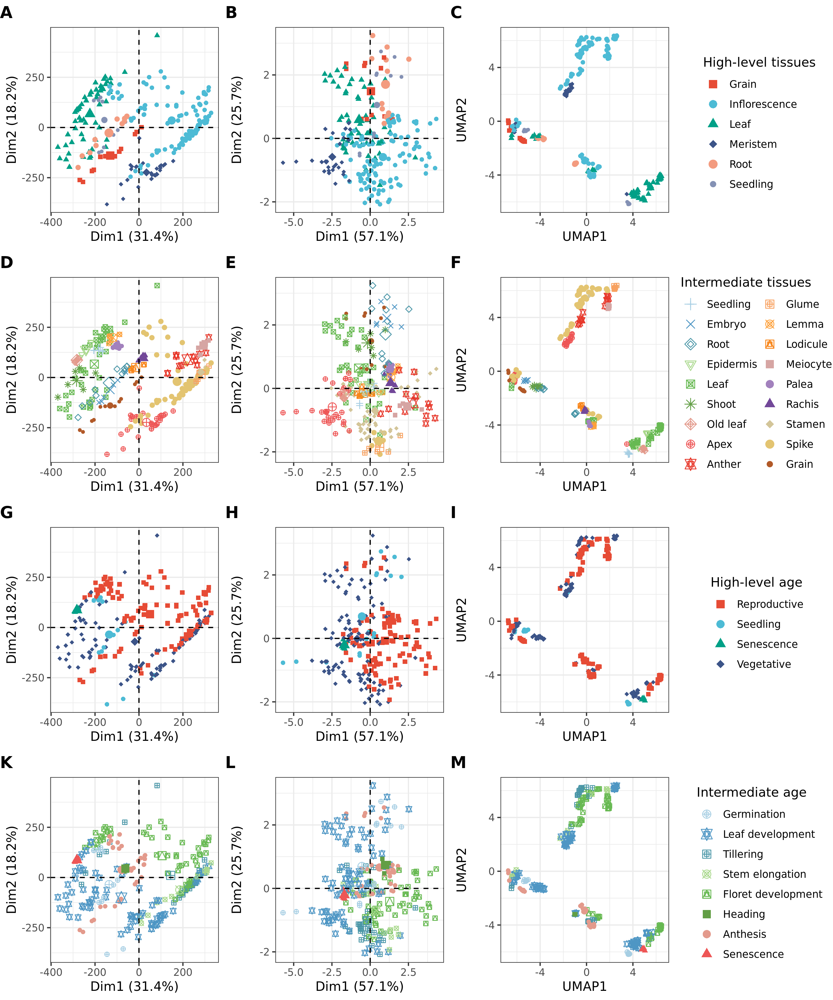

In [230]:
# giant exploratory analysis comparism figures
# here UMAP is on RAW-counts!!!
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")

prow1 <- plot_grid(a1 + theme(legend.position="none"),
                   c1 + theme(legend.position="none"),
                   rb1 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend1 <- get_legend(a1 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t1 <- plot_grid(prow1, legend1, nrow = 1, rel_widths = c(3, .7))

prow2 <- plot_grid(a2 + theme(legend.position="none"),
                   c2 + theme(legend.position="none"),
                   rb2 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend2 <- get_legend(a2 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t2 <- plot_grid(prow2, legend2, nrow = 1, rel_widths = c(3, .7))

prow3 <- plot_grid(a3 + theme(legend.position="none"),
                   c3 + theme(legend.position="none"),
                   rb3 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend3 <- get_legend(a3 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t3 <- plot_grid(prow3, legend3, nrow = 1, rel_widths = c(3, .7))

prow4 <- plot_grid(a4 + theme(legend.position="none"),
                   c4 + theme(legend.position="none"),
                   rb4 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend4 <- get_legend(a4 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t4 <- plot_grid(prow4, legend4, nrow = 1, rel_widths = c(3, .7))

prow5 <- plot_grid(a5 + theme(legend.position="none"),
                   c5 + theme(legend.position="none"),
                   rb5 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend5 <- get_legend(a5 + guides(color = guide_legend(ncol = 2)) + theme(legend.position = "right"))
t5 <- plot_grid(prow5, legend5, nrow = 1, rel_widths = c(3, .7))

prow6 <- plot_grid(a6 + theme(legend.position="none"),
                   c6 + theme(legend.position="none"),
                   rb6 + theme(legend.position="none"),
                   labels = c( "K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend6 <- get_legend(a6 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t6 <- plot_grid(prow6, legend6, nrow = 1, rel_widths = c(3, .7))


prow7 <- plot_grid(a7 + theme(legend.position="none"),
                   c7 + theme(legend.position="none"),
                   rb7 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend7 <- get_legend(a7 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t7 <- plot_grid(prow7, legend7, nrow = 1, rel_widths = c(3, .7))

prow8 <- plot_grid(a8 + theme(legend.position="none"),
                   c8 + theme(legend.position="none"),
                   rb8 + theme(legend.position="none"),
                   labels = c("K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend8 <- get_legend(a8 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t8 <- plot_grid(prow8, legend8, nrow = 1, rel_widths = c(3, .7))

prow9 <- plot_grid(a9 + theme(legend.position="none"),
                   c9 + theme(legend.position="none"),
                   rb9 + theme(legend.position="none"),
                   labels = c( "N", "O", "P"),
                   align = 'vh', hjust = 0, nrow = 1)
legend9 <- get_legend(a9 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t9 <- plot_grid(prow9, legend9, nrow = 1, rel_widths = c(3, .7))

# figures:
# - 1(dataset),7(cultivar),2(library),8(gm),9(growth)
# - 4(high_tissue),5(intermed_tissue),3(high_age),6(intermed_age)

options(repr.plot.width = 10, repr.plot.height = 15, repr.plot.res = 300)
fig1 <- plot_grid(t1, t7, t2, t8, t9, nrow = 5)
fig1

options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 300)
fig2 <- plot_grid(t4, t5, t3, t6, nrow = 4)
fig2

ggsave("pca_umap1_raw_barley.pdf", plot = fig1, width = 10, height = 15)
ggsave("pca_umap2_raw_barley.pdf", plot = fig2, width = 10, height = 12)

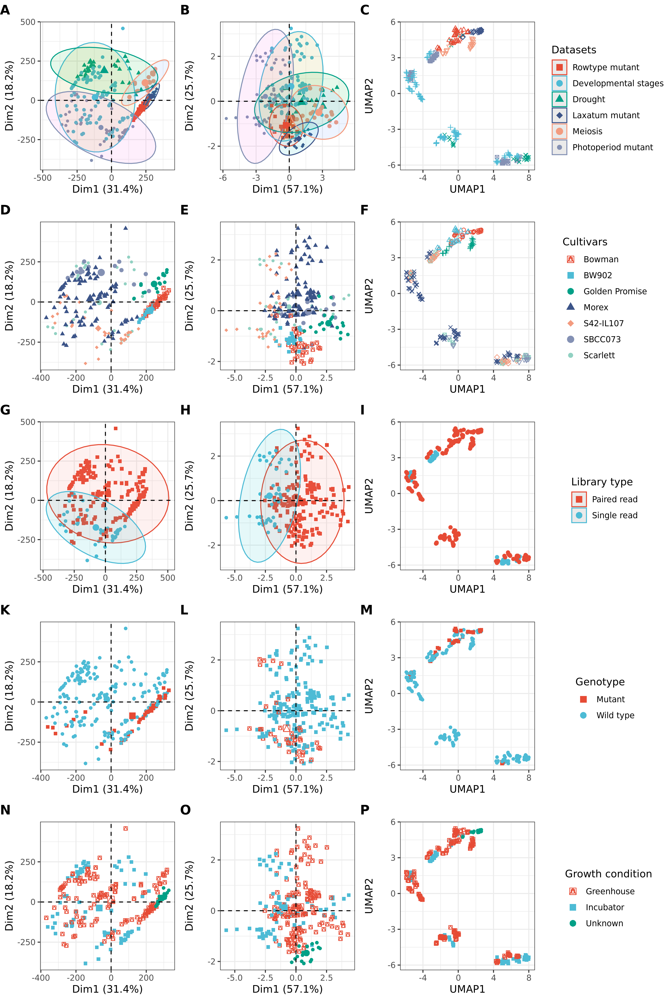

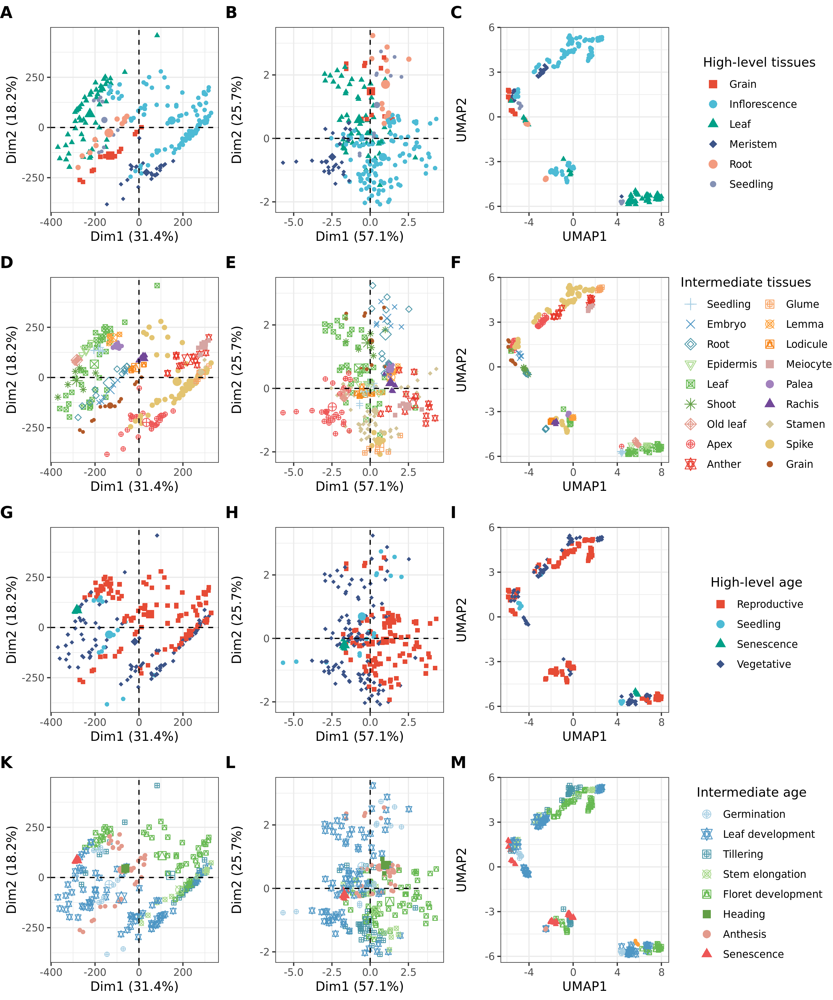

In [231]:
# giant exploratory analysis comparism figures
# here UMAP is on RAW-filtered-counts!!!
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")

prow1 <- plot_grid(a1 + theme(legend.position="none"),
                   c1 + theme(legend.position="none"),
                   rfb1 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend1 <- get_legend(a1 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t1 <- plot_grid(prow1, legend1, nrow = 1, rel_widths = c(3, .7))

prow2 <- plot_grid(a2 + theme(legend.position="none"),
                   c2 + theme(legend.position="none"),
                   rfb2 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend2 <- get_legend(a2 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t2 <- plot_grid(prow2, legend2, nrow = 1, rel_widths = c(3, .7))

prow3 <- plot_grid(a3 + theme(legend.position="none"),
                   c3 + theme(legend.position="none"),
                   rfb3 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend3 <- get_legend(a3 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t3 <- plot_grid(prow3, legend3, nrow = 1, rel_widths = c(3, .7))

prow4 <- plot_grid(a4 + theme(legend.position="none"),
                   c4 + theme(legend.position="none"),
                   rfb4 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend4 <- get_legend(a4 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t4 <- plot_grid(prow4, legend4, nrow = 1, rel_widths = c(3, .7))

prow5 <- plot_grid(a5 + theme(legend.position="none"),
                   c5 + theme(legend.position="none"),
                   rfb5 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend5 <- get_legend(a5 + guides(color = guide_legend(ncol = 2)) + theme(legend.position = "right"))
t5 <- plot_grid(prow5, legend5, nrow = 1, rel_widths = c(3, .7))

prow6 <- plot_grid(a6 + theme(legend.position="none"),
                   c6 + theme(legend.position="none"),
                   rfb6 + theme(legend.position="none"),
                   labels = c( "K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend6 <- get_legend(a6 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t6 <- plot_grid(prow6, legend6, nrow = 1, rel_widths = c(3, .7))


prow7 <- plot_grid(a7 + theme(legend.position="none"),
                   c7 + theme(legend.position="none"),
                   rfb7 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend7 <- get_legend(a7 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t7 <- plot_grid(prow7, legend7, nrow = 1, rel_widths = c(3, .7))

prow8 <- plot_grid(a8 + theme(legend.position="none"),
                   c8 + theme(legend.position="none"),
                   rfb8 + theme(legend.position="none"),
                   labels = c("K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend8 <- get_legend(a8 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t8 <- plot_grid(prow8, legend8, nrow = 1, rel_widths = c(3, .7))

prow9 <- plot_grid(a9 + theme(legend.position="none"),
                   c9 + theme(legend.position="none"),
                   rfb9 + theme(legend.position="none"),
                   labels = c( "N", "O", "P"),
                   align = 'vh', hjust = 0, nrow = 1)
legend9 <- get_legend(a9 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t9 <- plot_grid(prow9, legend9, nrow = 1, rel_widths = c(3, .7))

# figures:
# - 1(dataset),7(cultivar),2(library),8(gm),9(growth)
# - 4(high_tissue),5(intermed_tissue),3(high_age),6(intermed_age)

options(repr.plot.width = 10, repr.plot.height = 15, repr.plot.res = 300)
fig1 <- plot_grid(t1, t7, t2, t8, t9, nrow = 5)
fig1

options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 300)
fig2 <- plot_grid(t4, t5, t3, t6, nrow = 4)
fig2

ggsave("pca_umap1_raw_filtered_barley.pdf", plot = fig1, width = 10, height = 15)
ggsave("pca_umap2_raw_filtered_barley.pdf", plot = fig2, width = 10, height = 12)

In [105]:
sessionInfo()

R version 3.6.3 (2020-02-29)
Platform: x86_64-conda_cos6-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /home/vanda.marosi/anaconda3/envs/r/lib/libopenblasp-r0.3.9.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=de_DE.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=de_DE.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=de_DE.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=de_DE.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] svglite_1.2.3.2             ggsci_2.9                  
 [3] umap_0.2.6.0                RColorBrewer_1.1-2         
 [5] edgeR_3.28.0                limma_3.42.0               
 [7] factoextra_1.0.7            FactoMineR_2.3             
 [9] hexbin_1.27.2           